In [1]:
'''
This code contains the explicit version of dorsal-to and anterior-to ontology violations
'''

'\nThis code contains the explicit version of dorsal-to and anterior-to ontology violations\n'

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.misc as misc
import warnings
warnings.filterwarnings('ignore')

#### Helper Functions

In [2]:
def eigen_vectors(mask):
    y, x = np.nonzero(mask)
    mean_x = np.mean(x)
    mean_y = np.mean(y)
    x = x - np.mean(x)
    y = y - np.mean(y)
    coords = np.vstack([x, y])
    cov = np.cov(coords)
    evals, evecs = np.linalg.eig(cov)
    sort_indices = np.argsort(evals)[::-1]
    x_v1, y_v1 = evecs[:, sort_indices[0]]  # Eigenvector with largest eigenvalue
    x_v2, y_v2 = evecs[:, sort_indices[1]]
    return np.array([x_v1, y_v1]), np.array([x_v2, y_v2]), mean_x, mean_y, x, y

def trait_coords(mask, trait_idx, mean_x, mean_y):
    trait = (mask == trait_idx).astype(float)
    y, x = np.nonzero(trait)
    x = x - mean_x
    y = y - mean_y
    return x, y

def projection(u, v):
    '''
    input: u, v numpy array
    output: vector projection of u on v
    '''
    proj_u_on_v = (np.dot(u, v)/np.dot(v, v))*v
    return proj_u_on_v

def average_projection_point(trait_x, trait_y, eig_v):
    proj_x = []
    proj_y = []
    for idx in range(trait_x.shape[0]):
        proj_ = projection(np.array([trait_x[idx], trait_y[idx]]), eig_v)
        proj_x.append(proj_[0])        
        proj_y.append(proj_[1])
    mid_x = np.sum(proj_x)/len(proj_x)
    mid_y = np.sum(proj_y)/len(proj_y)
    return np.array([mid_x, mid_y])

In [25]:
def dorsal_to_explicit(mask, channel_wise=False):
    if channel_wise:
        decoded_channel = np.zeros((mask.shape[0], mask.shape[1]))
        for ch in range(0, mask.shape[2]):
            decoded_channel += ((ch+1)*mask[:, :, ch])
        mask = decoded_channel
        
        
    pc1, pc2, mean_x, mean_y, x, y = eigen_vectors(mask)
    
    dorsal_x, dorsal_y = trait_coords(mask, trait_idx=1, mean_x=mean_x, mean_y=mean_y) # dorsal
    dorsal_mid = average_projection_point(dorsal_x, dorsal_y, pc2) # dorsal mid point on pc2

    adipose_x, adipose_y = trait_coords(mask, trait_idx=2, mean_x=mean_x, mean_y=mean_y) # adipose
    adipose_mid = average_projection_point(dorsal_x, dorsal_y, pc2)
    
    pectoral_x, pectoral_y = trait_coords(mask, trait_idx=6, mean_x=mean_x, mean_y=mean_y) # dorsal
    pectoral_mid = average_projection_point(pectoral_x, pectoral_y, pc2) # pectoral mid point on pc2

    pelvic_x, pelvic_y = trait_coords(mask, trait_idx=5, mean_x=mean_x, mean_y=mean_y) # dorsal
    pelvic_mid = average_projection_point(pelvic_x, pelvic_y, pc2) # pelvic mid point on pc2

    anal_x, anal_y = trait_coords(mask, trait_idx=4, mean_x=mean_x, mean_y=mean_y) # dorsal
    anal_mid = average_projection_point(anal_x, anal_y, pc2) # anal mid point on pc2

    penalty = 0 
    
    if dorsal_mid[0] != dorsal_mid[0]: # no dorsal fin has been predicted
        return penalty # returning 0 penalty
    else:
        if dorsal_mid[1] < 0: # opposite side of dorsal should be positive
            if pectoral_mid[0] == pectoral_mid[0]:
                penalty += float(pectoral_mid[1] < dorsal_mid[1])
            if pelvic_mid[0] == pelvic_mid[0]:
                penalty += float(pelvic_mid[1] < dorsal_mid[1])
            if anal_mid[0] == anal_mid[0]:
                penalty += float(anal_mid[1] < dorsal_mid[1])
                
            if adipose_mid[0] == adipose_mid[0]: # adipose fin has been predicted
                if pectoral_mid[0] == pectoral_mid[0]:
                    penalty += float(pectoral_mid[1] < adipose_mid[1])
                if pelvic_mid[0] == pelvic_mid[0]:
                    penalty += float(pelvic_mid[1] < adipose_mid[1])
                if anal_mid[0] == anal_mid[0]:
                    penalty += float(anal_mid[1] < adipose_mid[1])
                    
        elif dorsal_mid[1] > 0: # opposite side of dorsal should be negative
            if pectoral_mid[0] == pectoral_mid[0]:
                penalty += float(pectoral_mid[1] > dorsal_mid[1])
            if pelvic_mid[0] == pelvic_mid[0]:
                penalty += float(pelvic_mid[1] > dorsal_mid[1])
            if anal_mid[0] == anal_mid[0]:
                penalty += float(anal_mid[1] > dorsal_mid[1])   
            
            if adipose_mid[0] == adipose_mid[0]: # adipose fin has been predicted
                if pectoral_mid[0] == pectoral_mid[0]:
                    penalty += float(pectoral_mid[1] > adipose_mid[1])
                if pelvic_mid[0] == pelvic_mid[0]:
                    penalty += float(pelvic_mid[1] > adipose_mid[1])
                if anal_mid[0] == anal_mid[0]:
                    penalty += float(anal_mid[1] > adipose_mid[1])
                    
    return penalty

In [26]:
def anterior_to_explicit(mask, channel_wise=False):
    if channel_wise:
        decoded_channel = np.zeros((mask.shape[0], mask.shape[1]))
        for ch in range(0, mask.shape[2]):
            decoded_channel += ((ch+1)*mask[:, :, ch])
        mask = decoded_channel
        
    pc1, pc2, mean_x, mean_y, x, y = eigen_vectors(mask)
    
    dorsal_x, dorsal_y = trait_coords(mask, trait_idx=1, mean_x=mean_x, mean_y=mean_y) # dorsal
    dorsal_mid = average_projection_point(dorsal_x, dorsal_y, pc1) # dorsal mid point on pc1
    
    adipose_x, adipose_y = trait_coords(mask, trait_idx=2, mean_x=mean_x, mean_y=mean_y) # adipose
    adipose_mid = average_projection_point(adipose_x, adipose_y, pc1) # adipose mid point on pc1
    
    pectoral_x, pectoral_y = trait_coords(mask, trait_idx=6, mean_x=mean_x, mean_y=mean_y) # dorsal
    pectoral_mid = average_projection_point(pectoral_x, pectoral_y, pc1) # pectoral mid point on pc1
    
    pelvic_x, pelvic_y = trait_coords(mask, trait_idx=5, mean_x=mean_x, mean_y=mean_y) # dorsal
    pelvic_mid = average_projection_point(pelvic_x, pelvic_y, pc1) # pelvic mid point on pc1
    
    anal_x, anal_y = trait_coords(mask, trait_idx=4, mean_x=mean_x, mean_y=mean_y) # dorsal
    anal_mid = average_projection_point(anal_x, anal_y, pc1) # anal mid point on pc1
    
    head_x, head_y = trait_coords(mask, trait_idx=7, mean_x=mean_x, mean_y=mean_y) # dorsal
    head_mid = average_projection_point(head_x, head_y, pc1) # anal mid point on pc1
    
    caudal_x, caudal_y = trait_coords(mask, trait_idx=3, mean_x=mean_x, mean_y=mean_y) # dorsal
    caudal_mid = average_projection_point(caudal_x, caudal_y, pc1) # anal mid point on pc1
    
    penalty = 0
    if head_mid[0] != head_mid[0]: # no head has been predicted
        return penalty # returning 0 penalty
    
    if head_mid[0] < 0: #opposite side of head is positive

        if (pectoral_mid[0] == pectoral_mid[0]) and (anal_mid[0] == anal_mid[0]):
            penalty += float(pectoral_mid[0] > anal_mid[0])
        if (pectoral_mid[0] == pectoral_mid[0]) and (pelvic_mid[0] == pelvic_mid[0]):
            penalty += float(pectoral_mid[0] > pelvic_mid[0])
        if (pelvic_mid[0] == pelvic_mid[0]) and (anal_mid[0] == anal_mid[0]):
            penalty += float(pelvic_mid[0] > anal_mid[0])
        if (dorsal_mid[0] == dorsal_mid[0]) and (caudal_mid[0] == caudal_mid[0]):
            penalty += float(dorsal_mid[0] > caudal_mid[0])
        if (pectoral_mid[0] == pectoral_mid[0]) and (caudal_mid[0] == caudal_mid[0]):
            penalty += float(pectoral_mid[0] > caudal_mid[0])
        if (pelvic_mid[0] == pelvic_mid[0]) and (caudal_mid[0] == caudal_mid[0]):
            penalty += float(pelvic_mid[0] > caudal_mid[0])
        if (anal_mid[0] == anal_mid[0]) and (caudal_mid[0] == caudal_mid[0]):
            penalty += float(anal_mid[0] > caudal_mid[0])
        if adipose_mid[0] == adipose_mid[0]:
            if dorsal_mid[0] == dorsal_mid[0]:
                penalty += float(dorsal_mid[0] > adipose_mid[0])
            if caudal_mid[0] == caudal_mid[0]:
                penalty += float(adipose_mid[0] > caudal_mid[0])

    elif head_mid[0] > 0: #head side is positive
        if (pectoral_mid[0] == pectoral_mid[0]) and (anal_mid[0] == anal_mid[0]):
            penalty += float(pectoral_mid[0] < anal_mid[0])
        if (pectoral_mid[0] == pectoral_mid[0]) and (pelvic_mid[0] == pelvic_mid[0]):
            penalty += float(pectoral_mid[0] < pelvic_mid[0])
        if (pelvic_mid[0] == pelvic_mid[0]) and (anal_mid[0] == anal_mid[0]):
            penalty += float(pelvic_mid[0] < anal_mid[0])
        if (dorsal_mid[0] == dorsal_mid[0]) and (caudal_mid[0] == caudal_mid[0]):
            penalty += float(dorsal_mid[0] < caudal_mid[0])
        if (pectoral_mid[0] == pectoral_mid[0]) and (caudal_mid[0] == caudal_mid[0]):
            penalty += float(pectoral_mid[0] < caudal_mid[0])
        if (pelvic_mid[0] == pelvic_mid[0]) and (caudal_mid[0] == caudal_mid[0]):
            penalty += float(pelvic_mid[0] < caudal_mid[0])
        if (anal_mid[0] == anal_mid[0]) and (caudal_mid[0] == caudal_mid[0]):
            penalty += float(anal_mid[0] < caudal_mid[0])
        if adipose_mid[0] == adipose_mid[0]:
            if dorsal_mid[0] == dorsal_mid[0]:
                penalty += float(dorsal_mid[0] < adipose_mid[0])
            if caudal_mid[0] == caudal_mid[0]:
                penalty += float(adipose_mid[0] < caudal_mid[0])
                
    return penalty



In [27]:
from scripts.plot_settings import global_settings
global_settings()

def plot_dorsal_to(mask, channel_wise=False):
    if channel_wise:
        decoded_channel = np.zeros((mask.shape[0], mask.shape[1]))
        for ch in range(0, mask.shape[2]):
            decoded_channel += ((ch+1)*mask[:, :, ch])
        mask = decoded_channel
        
    
        
    pc1, pc2, mean_x, mean_y, x, y = eigen_vectors(mask)
    
    dorsal_x, dorsal_y = trait_coords(mask, trait_idx=1, mean_x=mean_x, mean_y=mean_y) # dorsal
    dorsal_mid = average_projection_point(dorsal_x, dorsal_y, pc2) # dorsal mid point on pc2

    adipose_x, adipose_y = trait_coords(mask, trait_idx=2, mean_x=mean_x, mean_y=mean_y) # adipose
    adipose_mid = average_projection_point(adipose_x, adipose_y, pc2)
    
    pectoral_x, pectoral_y = trait_coords(mask, trait_idx=6, mean_x=mean_x, mean_y=mean_y) # dorsal
    pectoral_mid = average_projection_point(pectoral_x, pectoral_y, pc2) # pectoral mid point on pc2

    pelvic_x, pelvic_y = trait_coords(mask, trait_idx=5, mean_x=mean_x, mean_y=mean_y) # dorsal
    pelvic_mid = average_projection_point(pelvic_x, pelvic_y, pc2) # pelvic mid point on pc2

    anal_x, anal_y = trait_coords(mask, trait_idx=4, mean_x=mean_x, mean_y=mean_y) # dorsal
    anal_mid = average_projection_point(anal_x, anal_y, pc2) # anal mid point on pc2
    
    scale = 200

    fig, ax = plt.subplots(figsize=(8, 6))
    plt.plot(x, y, 'k.')
    plt.plot([pc1[0]*-scale*2, pc1[0]*scale*2],
             [pc1[1]*-scale*2, pc1[1]*scale*2], color='green')
    plt.plot([pc2[0]*-scale*2, pc2[0]*scale*2],
             [pc2[1]*-scale*2, pc2[1]*scale*2], color='blue')

    if dorsal_mid[0] == dorsal_mid[0]:
        plt.plot(dorsal_x, dorsal_y, 'r.', alpha=0.2)
        plt.plot(dorsal_mid[0], dorsal_mid[1], 'k*')
        plt.plot(dorsal_mid[0], dorsal_mid[1], 'r.')
    if adipose_mid[0] == adipose_mid[0]:
        plt.plot(adipose_x, adipose_y, 'g.', alpha=0.2)
        plt.plot(adipose_mid[0], adipose_mid[1], 'k*')
        plt.plot(adipose_mid[0], adipose_mid[1], 'g.')
    if anal_mid[0] == anal_mid[0]:
        plt.plot(anal_x, anal_y, 'y.', alpha=0.2)
        plt.plot(anal_mid[0], anal_mid[1], 'k*')
        plt.plot(anal_mid[0], anal_mid[1], 'y.')
    if pectoral_mid[0] == pectoral_mid[0]:
        plt.plot(pectoral_x, pectoral_y, 'm.', alpha=0.2)
        plt.plot(pectoral_mid[0], pectoral_mid[1], 'k*')
        plt.plot(pectoral_mid[0], pectoral_mid[1], 'm.')
    if pelvic_mid[0] == pelvic_mid[0]:
        plt.plot(pelvic_x, pelvic_y, 'c.', alpha=0.2)
        plt.plot(pelvic_mid[0], pelvic_mid[1], 'k*')
        plt.plot(pelvic_mid[0], pelvic_mid[1], 'c.')
    if anal_mid[0] == anal_mid[0]:
        plt.plot(anal_x[0], anal_y[1], 'y.', alpha=0.2)
        plt.plot(anal_mid[0], anal_mid[1], 'k*')
        plt.plot(anal_mid[0], anal_mid[1], 'y.')
    plt.axis('equal')
    plt.gca().invert_yaxis()  # Match the image system with origin at top left
    plt.show()
    
    
def plot_anterior_to(mask, channel_wise=False):
    if channel_wise:
        decoded_channel = np.zeros((mask.shape[0], mask.shape[1]))
        for ch in range(0, mask.shape[2]):
            decoded_channel += ((ch+1)*mask[:, :, ch])
        mask = decoded_channel
        
    pc1, pc2, mean_x, mean_y, x, y = eigen_vectors(mask)
    
    dorsal_x, dorsal_y = trait_coords(mask, trait_idx=1, mean_x=mean_x, mean_y=mean_y) # dorsal
    dorsal_mid = average_projection_point(dorsal_x, dorsal_y, pc1) # dorsal mid point on pc2

    adipose_x, adipose_y = trait_coords(mask, trait_idx=2, mean_x=mean_x, mean_y=mean_y) # adipose
    adipose_mid = average_projection_point(adipose_x, adipose_y, pc1)
    
    pectoral_x, pectoral_y = trait_coords(mask, trait_idx=6, mean_x=mean_x, mean_y=mean_y) # dorsal
    pectoral_mid = average_projection_point(pectoral_x, pectoral_y, pc1) # pectoral mid point on pc2

    pelvic_x, pelvic_y = trait_coords(mask, trait_idx=5, mean_x=mean_x, mean_y=mean_y) # dorsal
    pelvic_mid = average_projection_point(pelvic_x, pelvic_y, pc1) # pelvic mid point on pc2

    anal_x, anal_y = trait_coords(mask, trait_idx=4, mean_x=mean_x, mean_y=mean_y) # dorsal
    anal_mid = average_projection_point(anal_x, anal_y, pc1) # anal mid point on pc2
    
    scale = 200

    fig, ax = plt.subplots(figsize=(8, 6))
    plt.plot(x, y, 'k.')
    plt.plot([pc1[0]*-scale*2, pc1[0]*scale*2],
             [pc1[1]*-scale*2, pc1[1]*scale*2], color='green')
    plt.plot([pc2[0]*-scale*2, pc2[0]*scale*2],
             [pc2[1]*-scale*2, pc2[1]*scale*2], color='blue')

    if dorsal_mid[0] == dorsal_mid[0]:
        plt.plot(dorsal_x, dorsal_y, 'r.', alpha=0.2)
        plt.plot(dorsal_mid[0], dorsal_mid[1], 'k*')
        plt.plot(dorsal_mid[0], dorsal_mid[1], 'r.')
    if adipose_mid[0] == adipose_mid[0]:
        plt.plot(adipose_x, adipose_y, 'g.', alpha=0.2)
        plt.plot(adipose_mid[0], adipose_mid[1], 'k*')
        plt.plot(adipose_mid[0], adipose_mid[1], 'g.')
    if anal_mid[0] == anal_mid[0]:
        plt.plot(anal_x, anal_y, 'y.', alpha=0.2)
        plt.plot(anal_mid[0], anal_mid[1], 'k*')
        plt.plot(anal_mid[0], anal_mid[1], 'y.')
    if pectoral_mid[0] == pectoral_mid[0]:
        plt.plot(pectoral_x, pectoral_y, 'm.', alpha=0.2)
        plt.plot(pectoral_mid[0], pectoral_mid[1], 'k*')
        plt.plot(pectoral_mid[0], pectoral_mid[1], 'm.')
    if pelvic_mid[0] == pelvic_mid[0]:
        plt.plot(pelvic_x, pelvic_y, 'c.', alpha=0.2)
        plt.plot(pelvic_mid[0], pelvic_mid[1], 'k*')
        plt.plot(pelvic_mid[0], pelvic_mid[1], 'c.')
    if anal_mid[0] == anal_mid[0]:
        plt.plot(anal_x[0], anal_y[1], 'y.', alpha=0.2)
        plt.plot(anal_mid[0], anal_mid[1], 'k*')
        plt.plot(anal_mid[0], anal_mid[1], 'y.')
    plt.axis('equal')
    plt.gca().invert_yaxis()  # Match the image system with origin at top left
    plt.show()
    

In [28]:
# mask = misc.imread('INHS_FISH_30228.png', flatten=1)
# print(anterior_to_explicit(mask))
# plot_anterior_to(mask)

In [29]:
%matplotlib inline
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image

from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset

import torch
import segmentation_models_pytorch as smp
import albumentations as albu

import seaborn as sns
import pylab as py
import pandas as pd

from scripts.preprocessing import Dataset
from scripts.helper import plot_double_image, plot_triple_image, get_color_img, get_concat_h
from scripts.augmentation import get_training_augmentation, get_validation_augmentation, to_tensor, get_preprocessing, get_preprocessing_unlabeled

DEVICE = ('cuda:2' if torch.cuda.is_available() else 'cpu')

In [30]:
# segmentation model with pretrained encoder
ENCODER = 'se_resnext50_32x4d'

ENCODER_WEIGHTS = 'imagenet'
CLASSES = ['dorsal', 'adipose', 'caudal', 'anal', 
           'pelvic', 'pectoral', 'head', 'eye', 
           'caudal-ray', 'alt-ray', 'alt-spine', 'trunk']

ACTIVATION = 'sigmoid'

model = smp.FPN(
    encoder_name = ENCODER,
    encoder_weights = ENCODER_WEIGHTS,
    classes = len(CLASSES),
    activation = ACTIVATION,
)

# preprocessing function for this encoder
preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

In [31]:
x_unlabeled_test_dir = '/raid/maruf/inhs-800/img_crp/'

test_dataset_unlabeled = Dataset(
    x_unlabeled_test_dir,
    masks_dir=None,
    augmentation = get_validation_augmentation(),
    preprocessing = get_preprocessing_unlabeled(preprocessing_fn),
    classes = CLASSES,
)

test_loader_unlabeled = DataLoader(test_dataset_unlabeled, batch_size=1)

num_test_img = len(test_dataset_unlabeled)

In [32]:
def plot_double_image(image_1, image_2, title_1=None, title_2=None):
    ''' This method plot two images side by side
    '''
    
    plt.figure(figsize=(16, 5))
    
    plt.subplot(1, 2, 1)
    plt.xticks([])
    plt.yticks([])
    if title_1 != None:
        plt.title(title_1)
    plt.imshow(image_1)
    
    plt.subplot(1, 2, 2)
    plt.xticks([])
    plt.yticks([])
    if title_2 != None:
        plt.title(title_2)
    plt.imshow(image_2)
    plt.show()

In [33]:
def plot_triple_image(image_1, image_2, image_3, 
                      title_1=None, title_2=None, title_3=None):
    ''' This method plot two images side by side
    '''
    
    plt.figure(figsize=(16, 8))
    
    plt.subplot(1, 3, 1)
    plt.xticks([])
    plt.yticks([])
    if title_1 != None:
        plt.title(title_1)
    plt.imshow(image_1)
    
    plt.subplot(1, 3, 2)
    plt.xticks([])
    plt.yticks([])
    if title_2 != None:
        plt.title(title_2)
    plt.imshow(image_2)
    plt.show()
    
    plt.subplot(1, 3, 3)
    plt.xticks([])
    plt.yticks([])
    if title_3 != None:
        plt.title(title_3)
    plt.imshow(image_3)
    plt.show()

In [34]:
def get_color_img(mask, normal=True):
    ''' mask shape -> (320, 800, 12) if normal=True
    else: mask shape -> (12, 320, 800)
        we want to output a PIL image with rgb color value
    '''
    colors = {}                            #   Name         Label
    #                                      # ----------------------
    colors[0] = np.array([0, 0, 0])        # Background      0
    colors[1] = np.array([254, 0, 0])      # Dorsal Fin      1
    colors[2] = np.array([0, 254, 0])      # Adipos Fin      2
    colors[3] = np.array([0, 0, 254])      # Caudal Fin      3
    colors[4] = np.array([254, 254, 0])    # Anal Fin        4
    colors[5] = np.array([0, 254, 254])    # Pelvic Fin      5
    colors[6] = np.array([254, 0, 254])    # Pectoral Fin    6
    colors[7] = np.array([254, 254, 254])  # Head            7
    colors[8] = np.array([0, 254, 102])    # Eye             8
    colors[9] = np.array([254, 102, 102])  # Caudal Fin Ray  9
    colors[10] = np.array([254, 102, 204]) # Alt Fin Ray     10
    colors[11] = np.array([254, 204, 102]) # Alt Fin Spine   11
    colors[12] = np.array([0, 124, 124])   # Trunk           12
    
    if normal == True:
        color_data = np.zeros((mask.shape[0], \
                               mask.shape[1], 3)).astype(np.uint8)

        for ch in range(0, mask.shape[2]):
            if mask[:, :, ch].sum() == 0:
                continue
            else:
                row_, col_ = np.where(mask[:, :, ch] == 1)
                color_data[row_, col_] = colors[ch+1]

        img_ = Image.fromarray(color_data)

        
        return img_
    
    else:
        color_data = np.zeros((mask.shape[1], \
                               mask.shape[2], 3)).astype(np.uint8)

        for ch in range(0, mask.shape[0]):
            if mask[ch, :, :].sum() == 0:
                continue
            else:
                row_, col_ = np.where(mask[ch, :, :] == 1)
                color_data[row_, col_] = colors[ch+1]
        img_ = Image.fromarray(color_data)
        
        
        return img_
        

### For best labeled + unlabeled batchwise

In [42]:
best_model = torch.load("saved_models/batchwise_unlab+lab_lambda_0.005.pth")
best_model = best_model.to(DEVICE)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


152 anterior_to penalty: 1.0


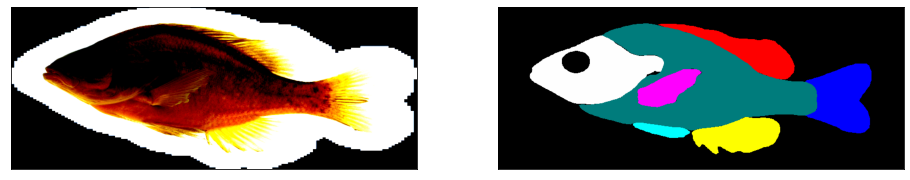

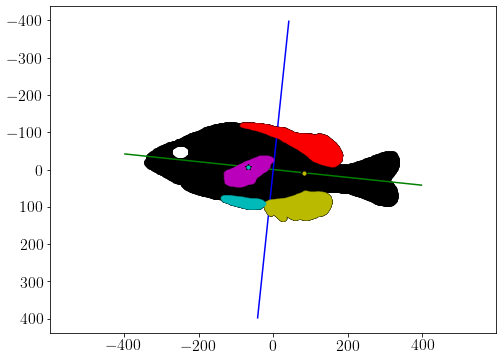


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


168 anterior_to penalty: 1.0


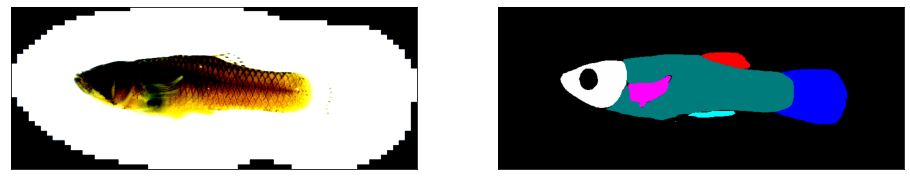

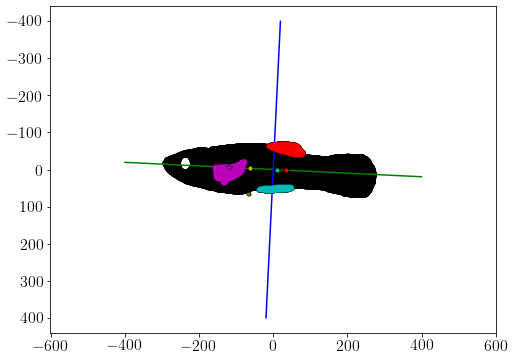


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


255 anterior_to penalty: 1.0


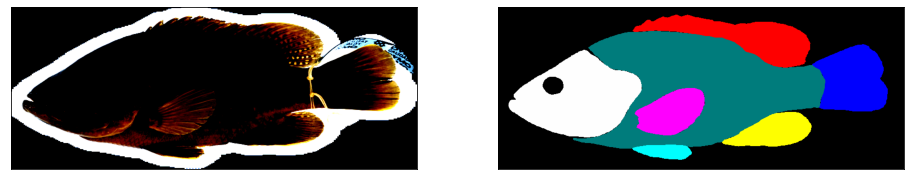

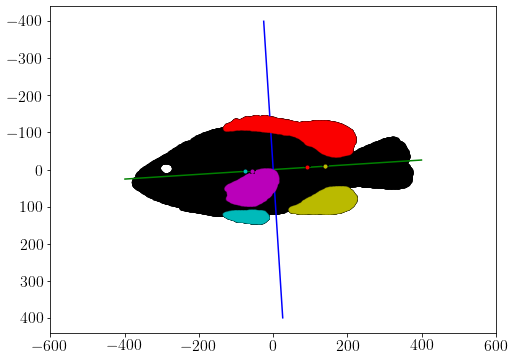


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


266 anterior_to penalty: 1.0


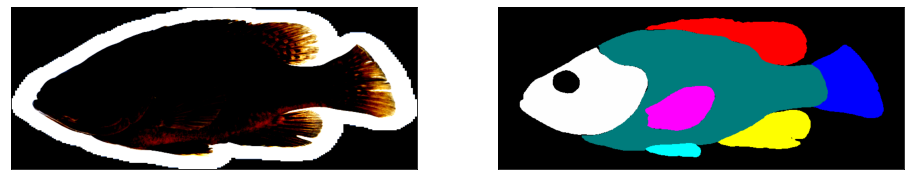

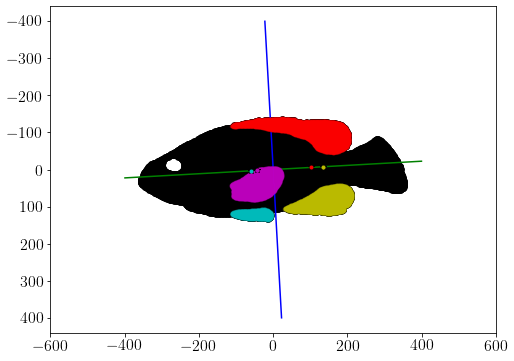


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


269 anterior_to penalty: 1.0


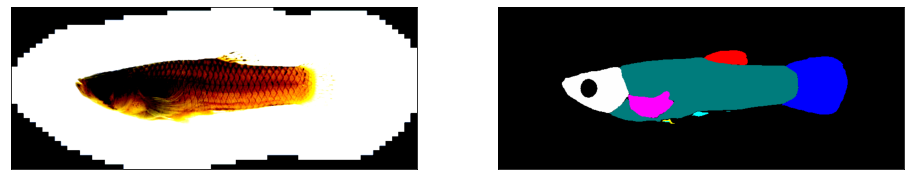

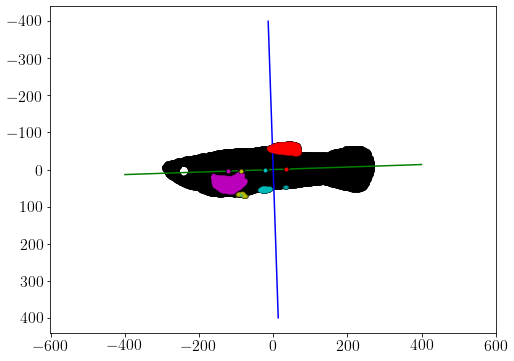


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


270 anterior_to penalty: 1.0


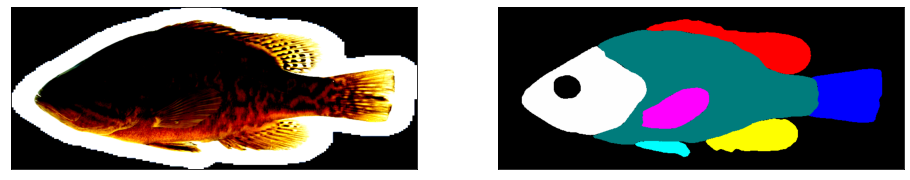

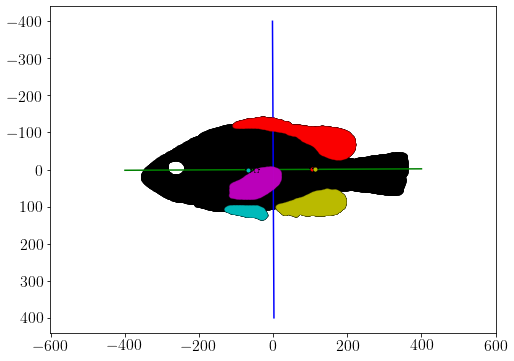


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


309 anterior_to penalty: 1.0


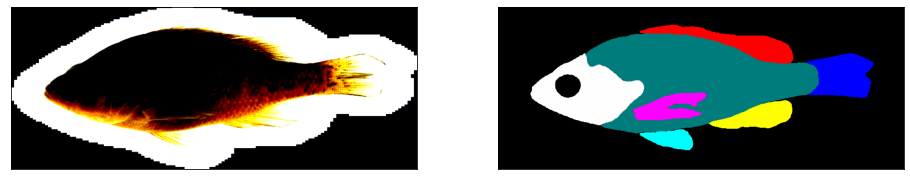

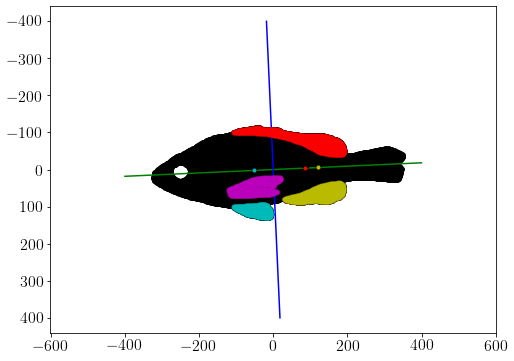


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


361 anterior_to penalty: 1.0


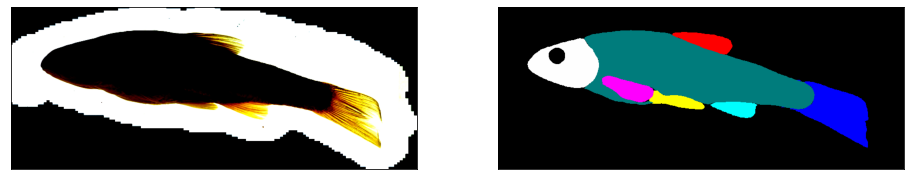

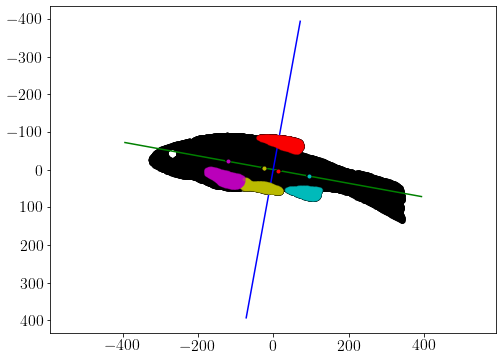


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


368 anterior_to penalty: 1.0


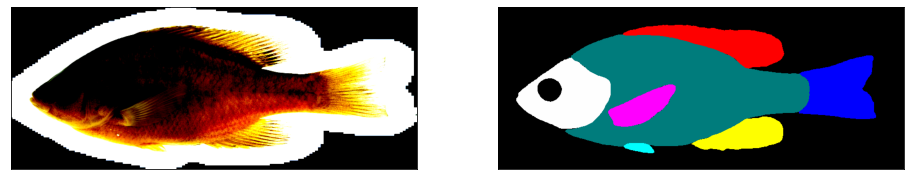

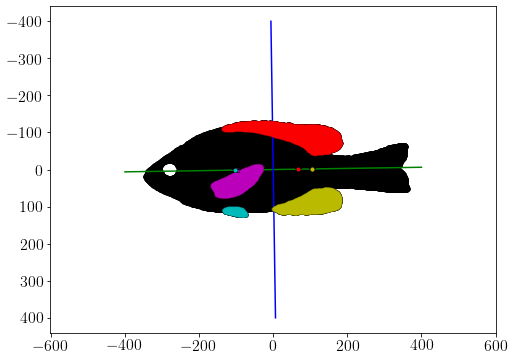


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


420 dorsal_to penalty: 2.0


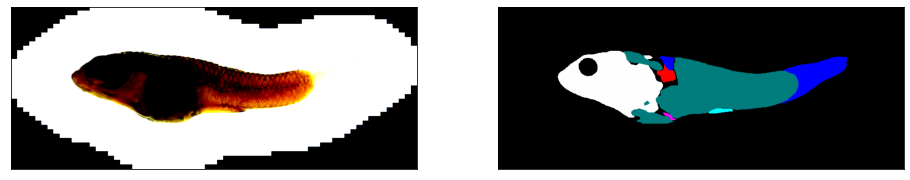

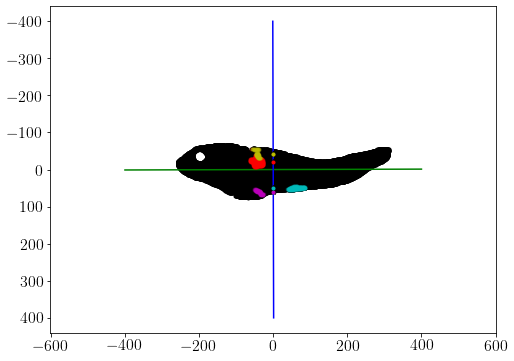

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



####################################################################################################

420 anterior_to penalty: 2.0


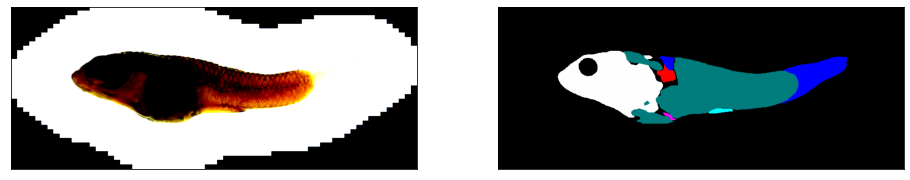

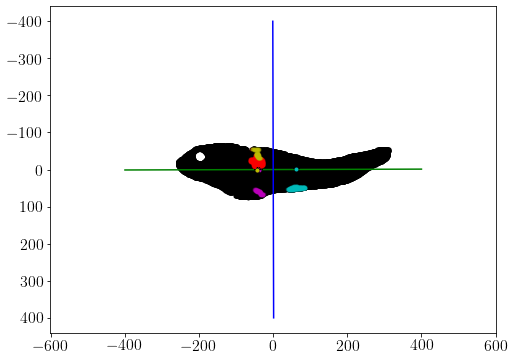


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


501 anterior_to penalty: 1.0


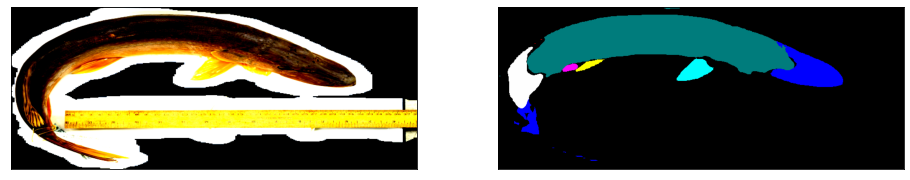

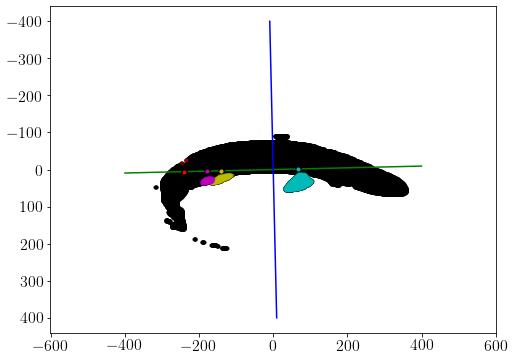


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


503 anterior_to penalty: 1.0


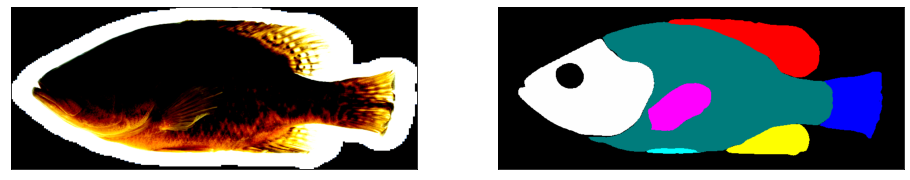

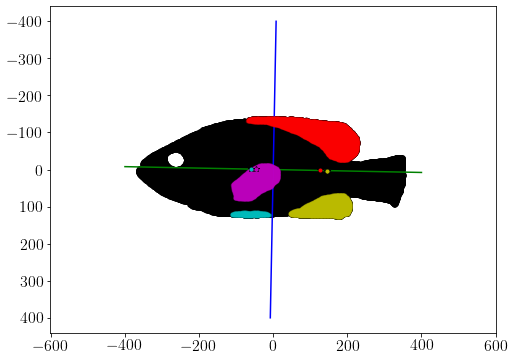


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


713 anterior_to penalty: 2.0


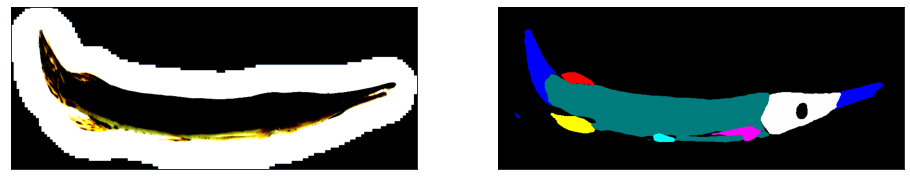

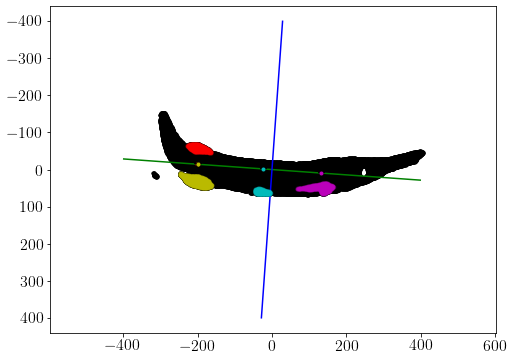


####################################################################################################



LinAlgError: Array must not contain infs or NaNs

In [43]:
for idx in range(num_test_img):
    i_ = test_dataset_unlabeled[idx]
    img = torch.from_numpy(i_).to(DEVICE).unsqueeze(0)
        
    mask = best_model.forward(img)
    mask = mask.permute(0, 2, 3, 1)
    mask = mask.squeeze().cpu().detach().numpy().round()
    
    penalty_dorsal_to = dorsal_to_explicit(mask, channel_wise=True)
    
    if penalty_dorsal_to != 0:
        
        print(idx, 'dorsal_to penalty:', penalty_dorsal_to)   
        
        im = img.squeeze(0).permute(1, 2, 0).cpu().detach().numpy()
        plot_double_image(im, get_color_img(mask))

        # plot the fish image that violates dorsal to 
        plot_dorsal_to(mask, channel_wise=True)
        
        print()
        print("#"*100)
        print()
    
        
    penalty_anterior_to = anterior_to_explicit(mask, channel_wise=True)

    if penalty_anterior_to != 0:
        
        print(idx, 'anterior_to penalty:', penalty_anterior_to)
      
        im = img.squeeze(0).permute(1, 2, 0).cpu().detach().numpy()
        plot_double_image(im, get_color_img(mask))
        
        # plot the fish image that violates anterior to
        plot_anterior_to(mask, channel_wise=True)
        
        print()
        print("#"*100)
        print()

    

### For best unlabeled + labeled Epochwise

In [44]:
best_model = torch.load("saved_models/unlabelled+labelled_lambda_0.05.pth")
best_model = best_model.to(DEVICE)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


104 anterior_to penalty: 1.0


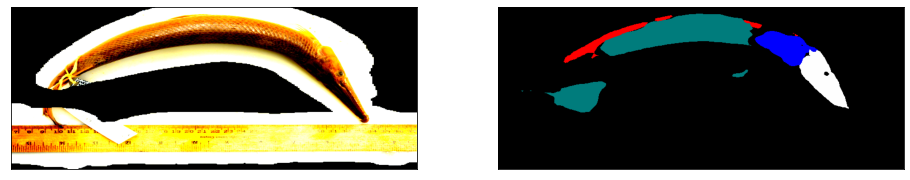

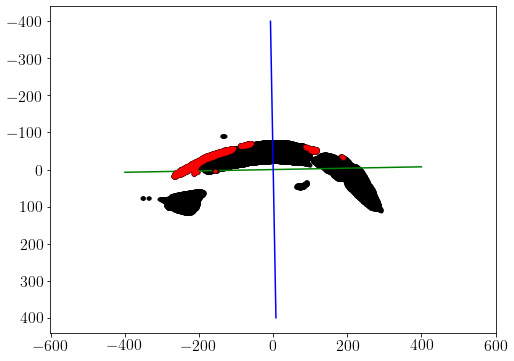


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


114 anterior_to penalty: 1.0


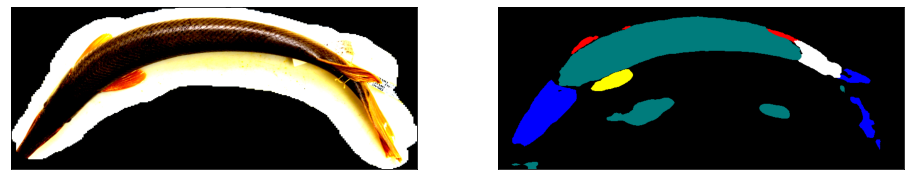

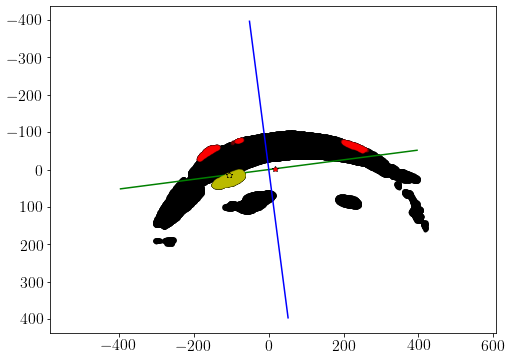


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


268 anterior_to penalty: 2.0


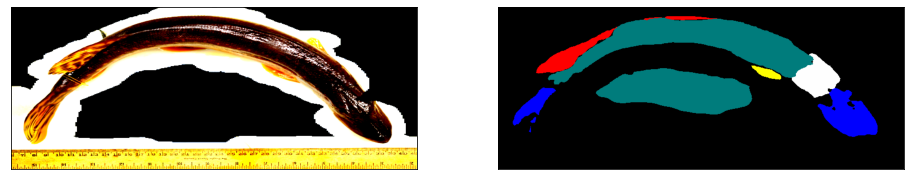

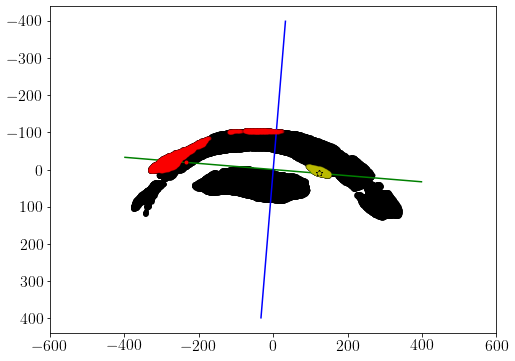


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


877 anterior_to penalty: 2.0


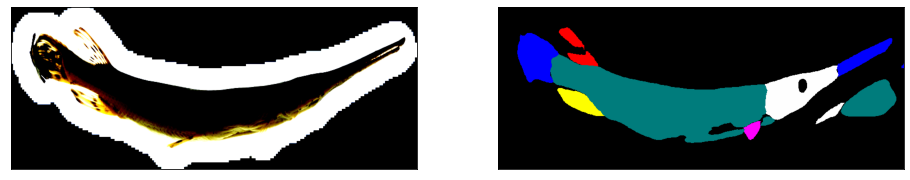

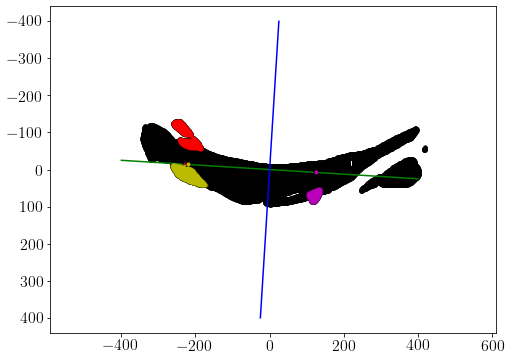


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1012 dorsal_to penalty: 2.0


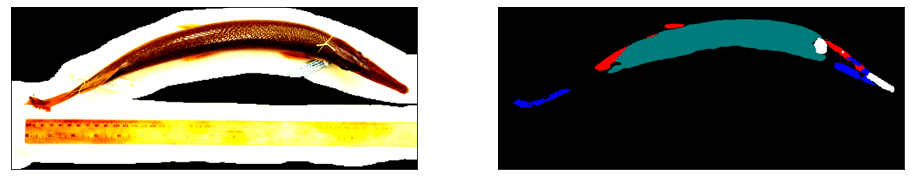

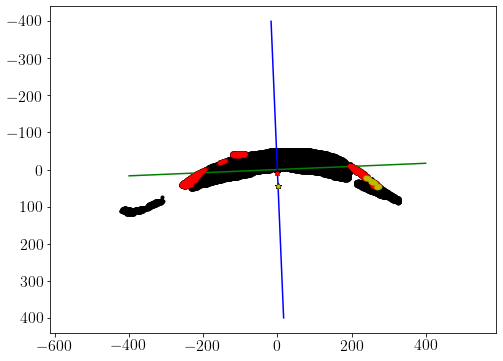


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1073 anterior_to penalty: 2.0


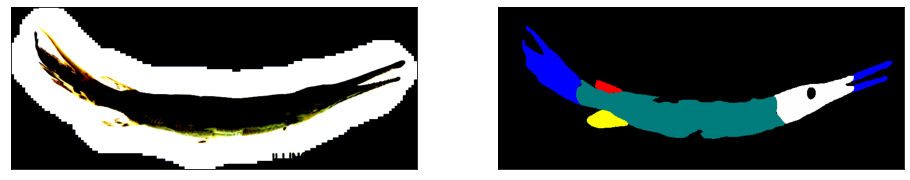

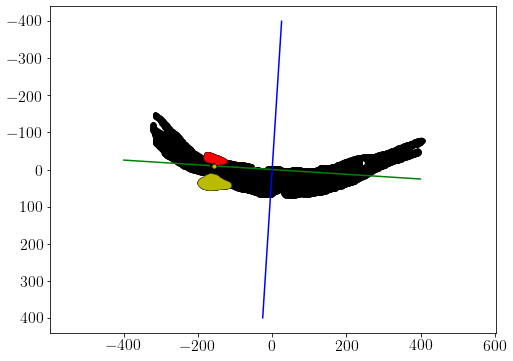


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1160 anterior_to penalty: 1.0


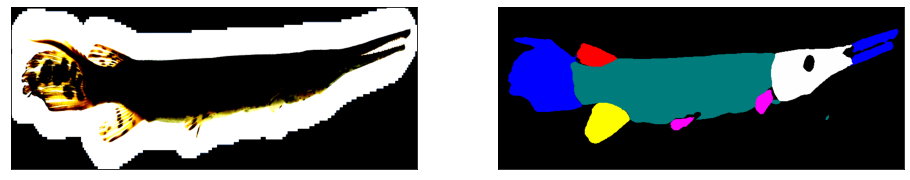

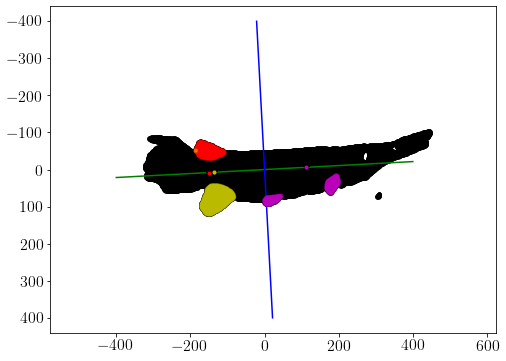


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1210 dorsal_to penalty: 2.0


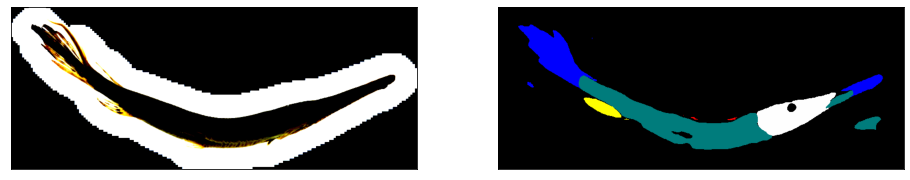

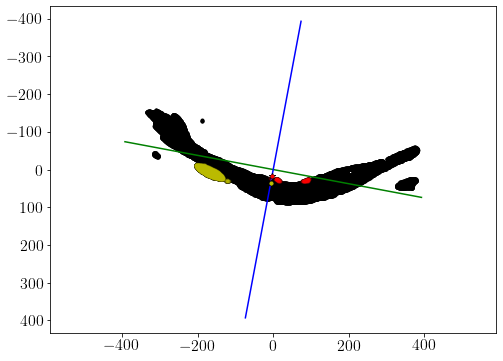


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1258 anterior_to penalty: 2.0


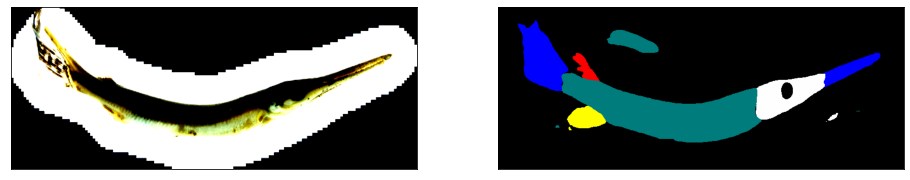

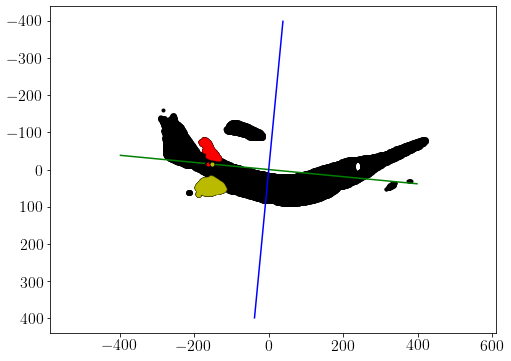


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1282 anterior_to penalty: 2.0


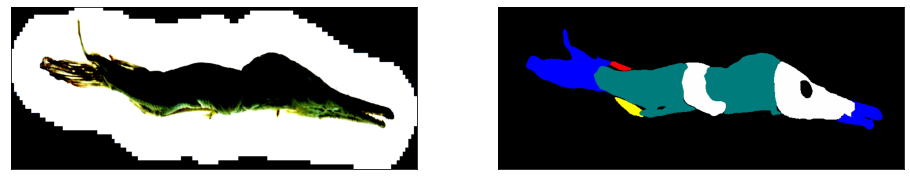

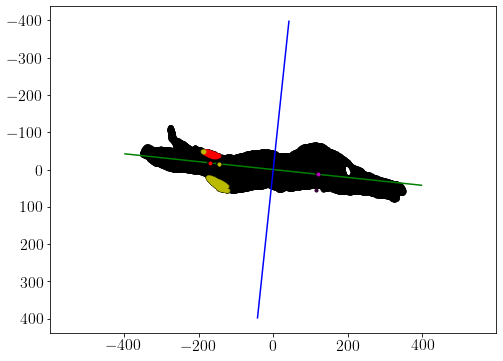


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1316 anterior_to penalty: 2.0


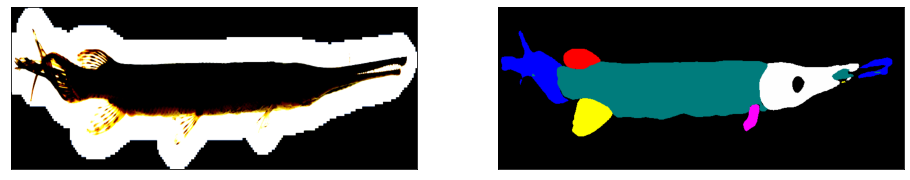

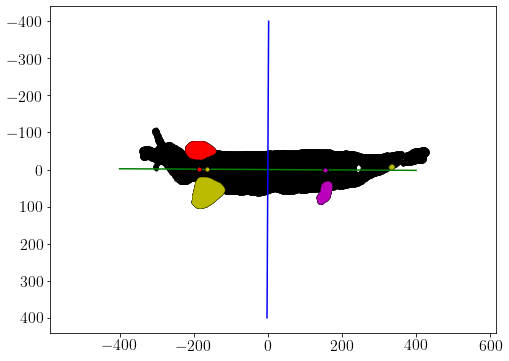


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1379 anterior_to penalty: 1.0


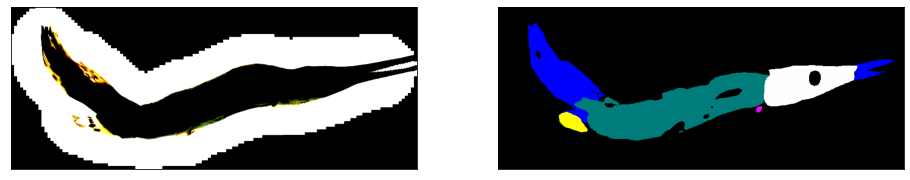

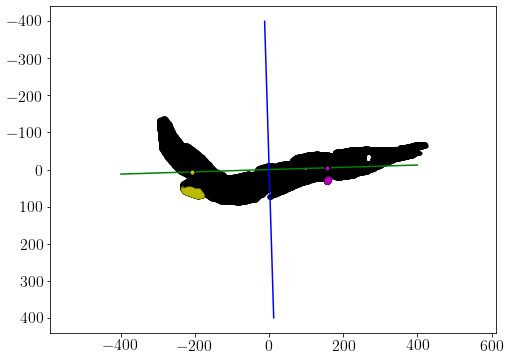


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1408 anterior_to penalty: 1.0


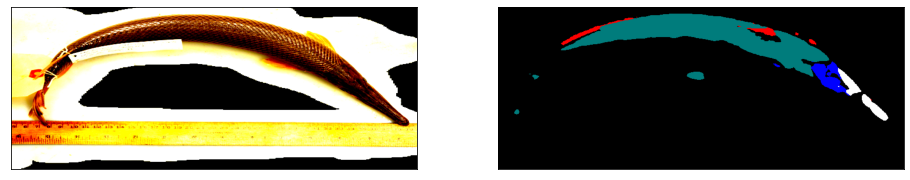

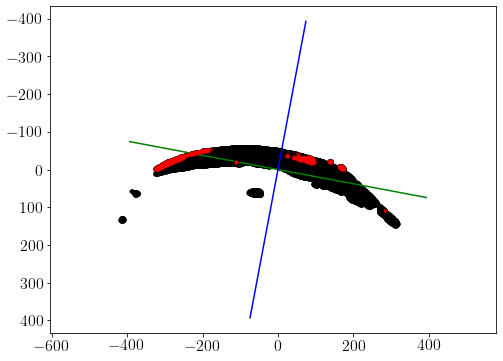


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1563 anterior_to penalty: 2.0


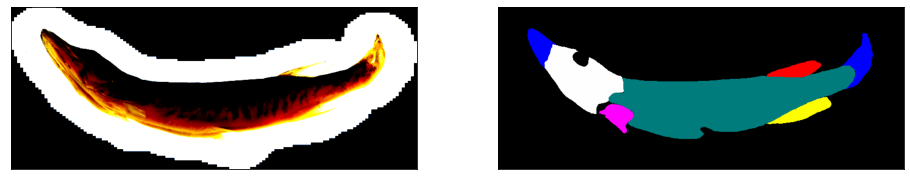

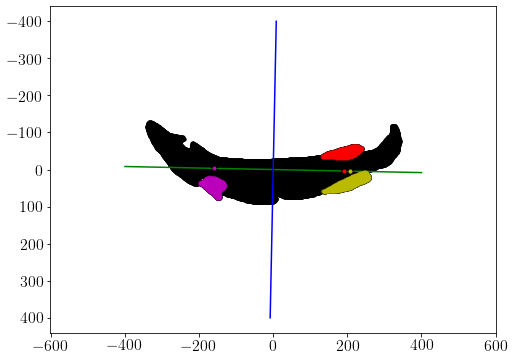


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1720 anterior_to penalty: 2.0


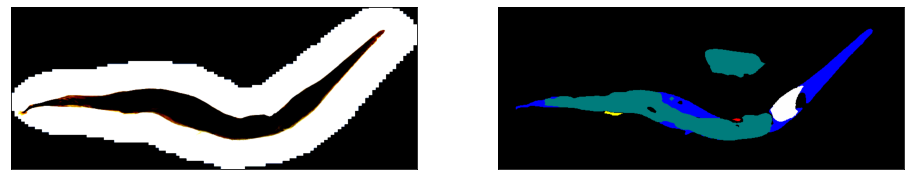

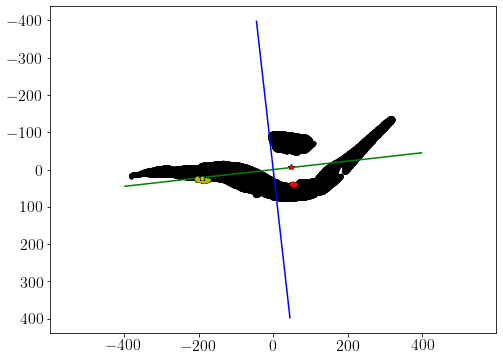


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2168 anterior_to penalty: 2.0


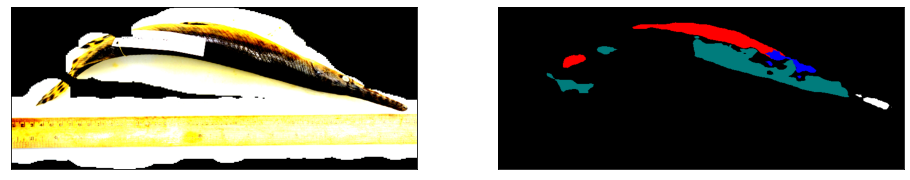

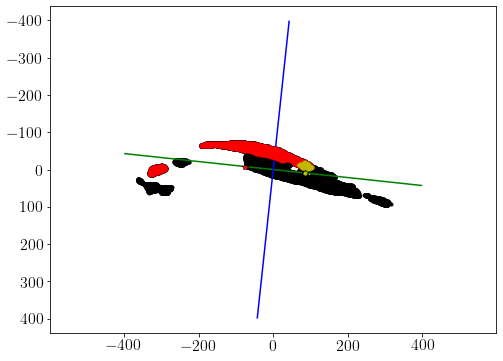


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2693 anterior_to penalty: 2.0


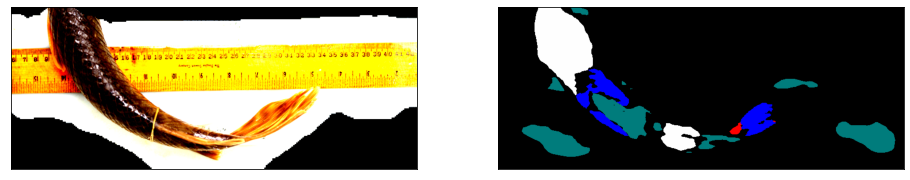

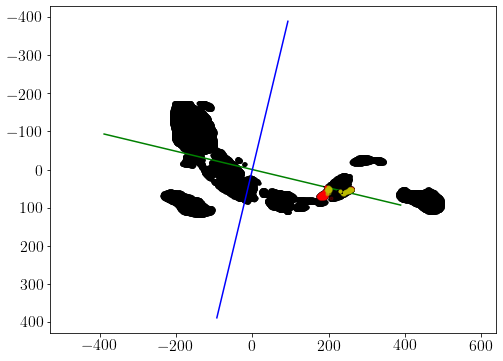


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2908 anterior_to penalty: 2.0


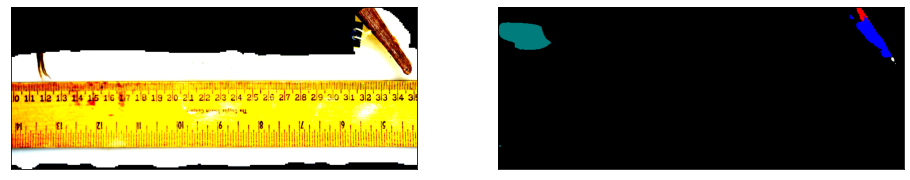

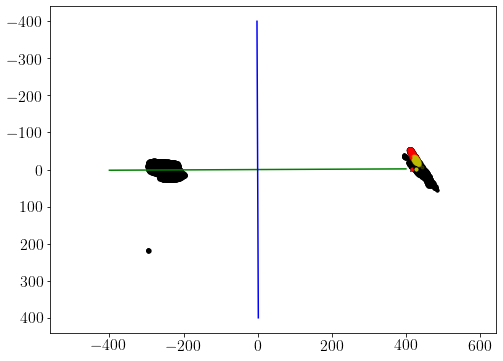


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2927 anterior_to penalty: 1.0


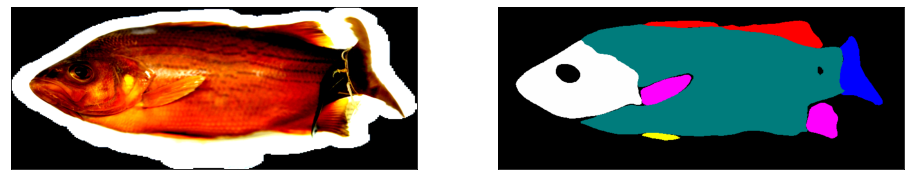

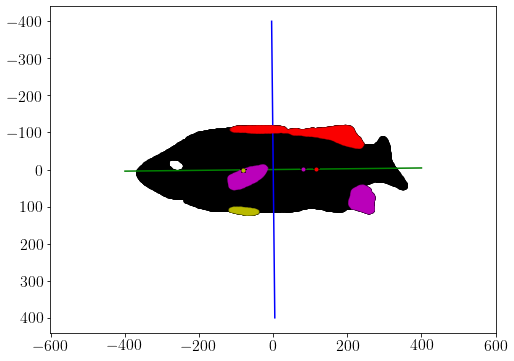


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2933 anterior_to penalty: 1.0


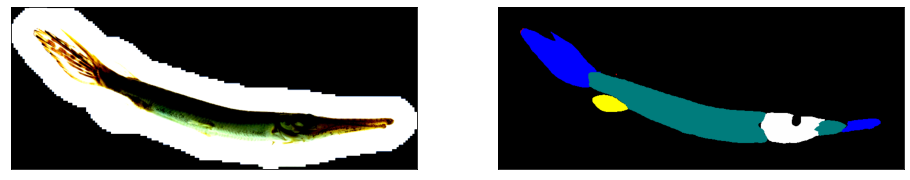

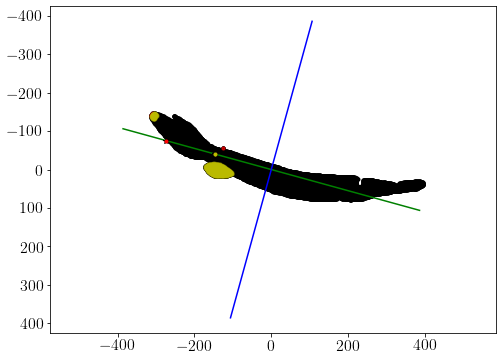


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2940 dorsal_to penalty: 2.0


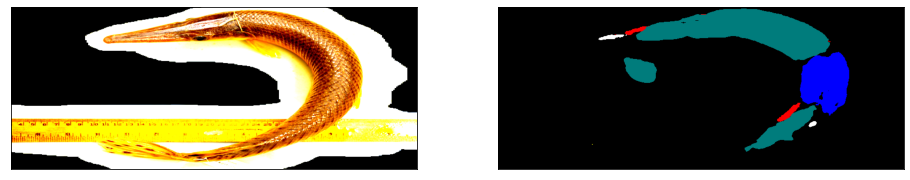

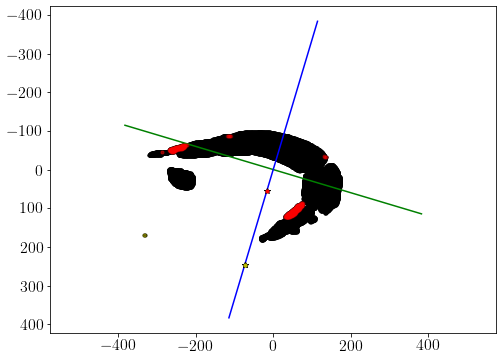


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3304 anterior_to penalty: 2.0


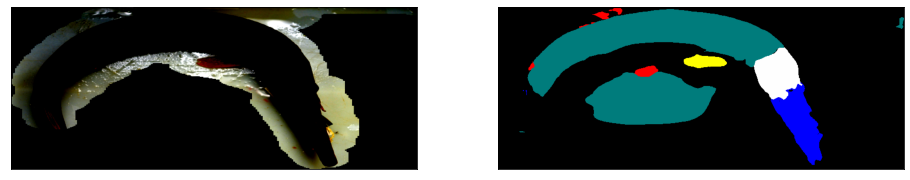

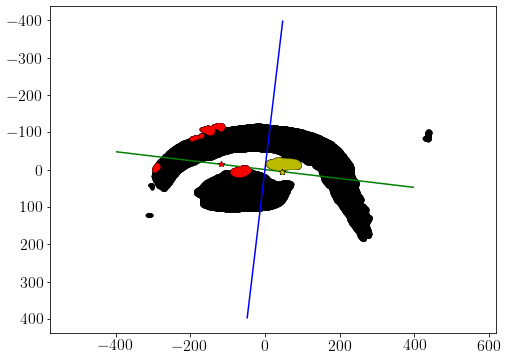


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3346 anterior_to penalty: 1.0


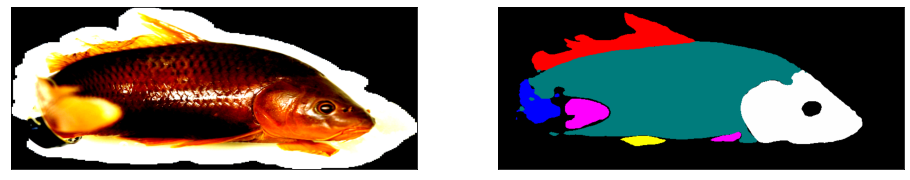

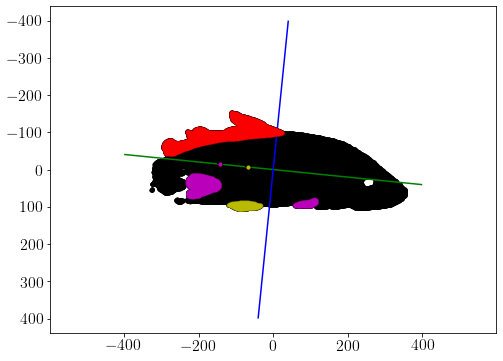


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3503 anterior_to penalty: 1.0


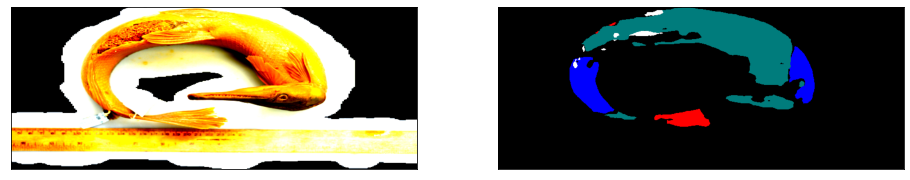

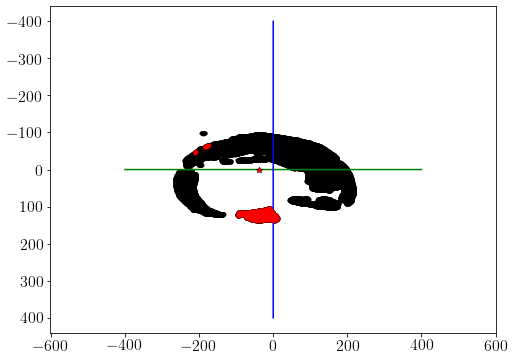


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3597 anterior_to penalty: 1.0


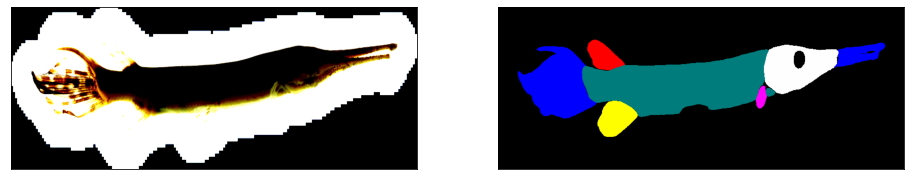

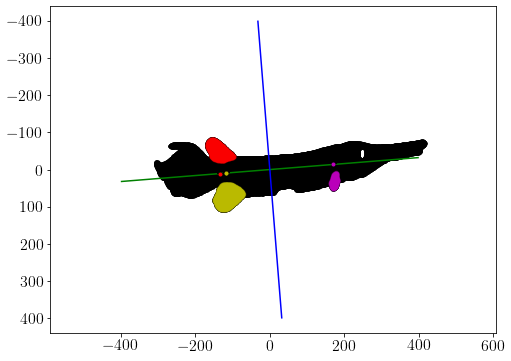


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3628 anterior_to penalty: 1.0


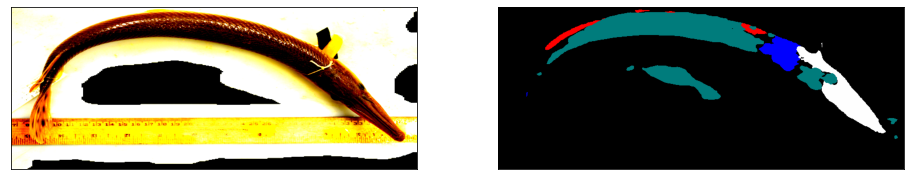

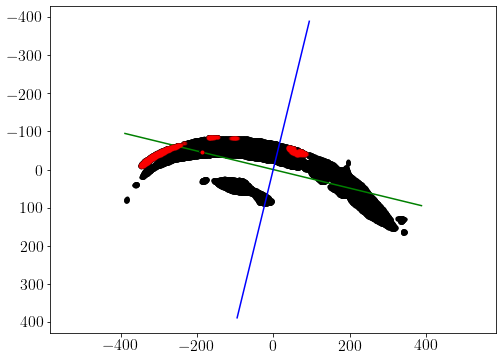


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3633 anterior_to penalty: 2.0


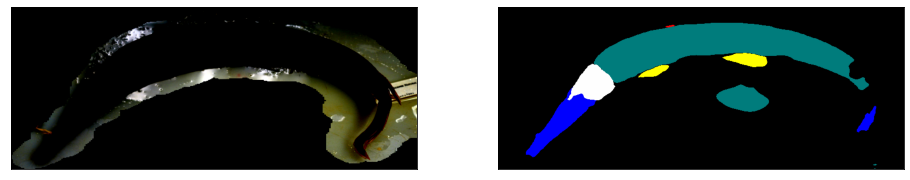

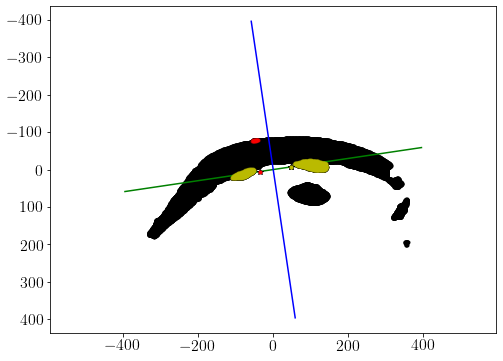


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3734 anterior_to penalty: 1.0


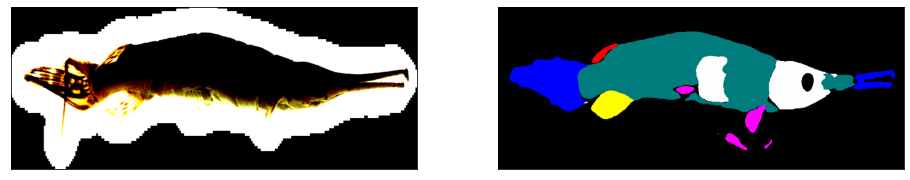

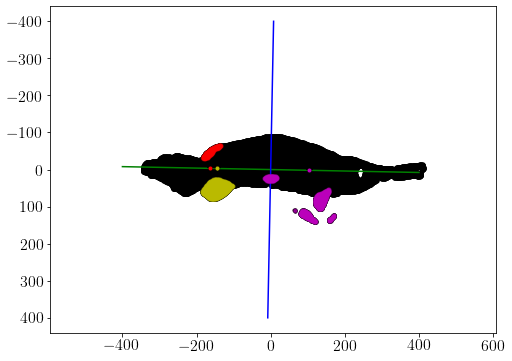


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3739 anterior_to penalty: 1.0


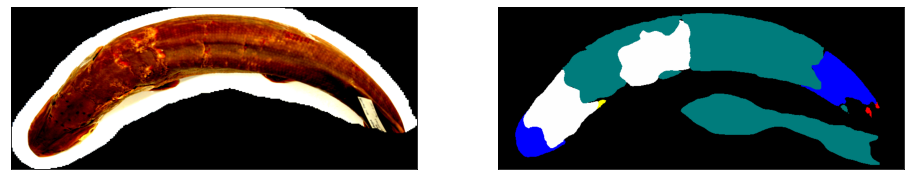

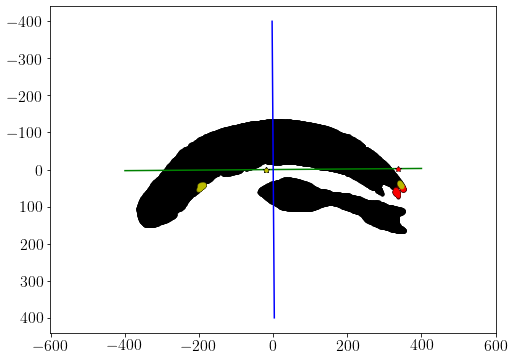


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3807 dorsal_to penalty: 2.0


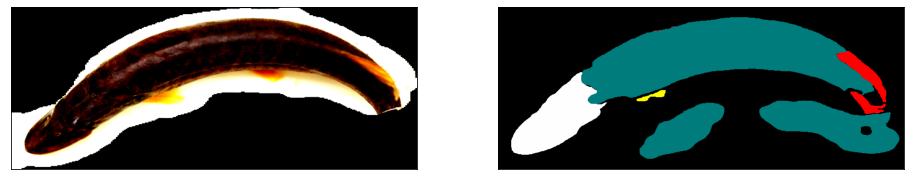

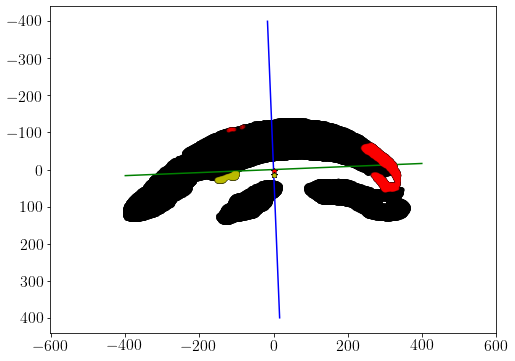


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3844 anterior_to penalty: 1.0


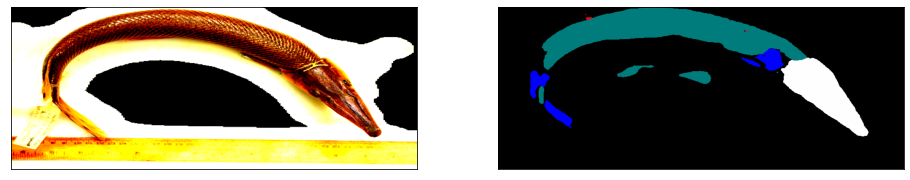

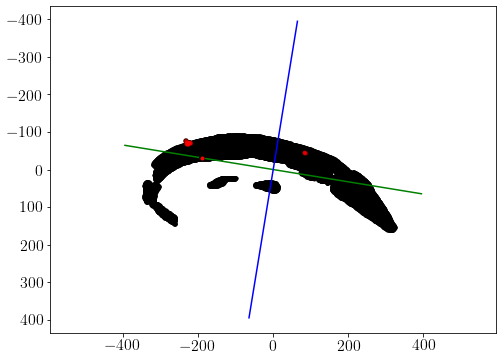


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3937 anterior_to penalty: 1.0


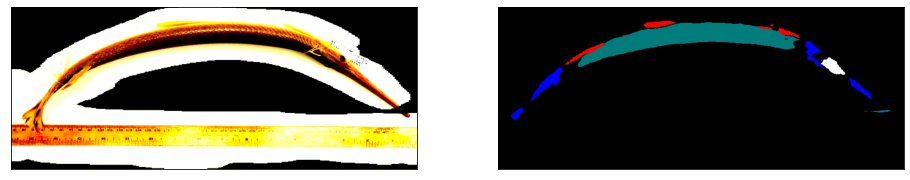

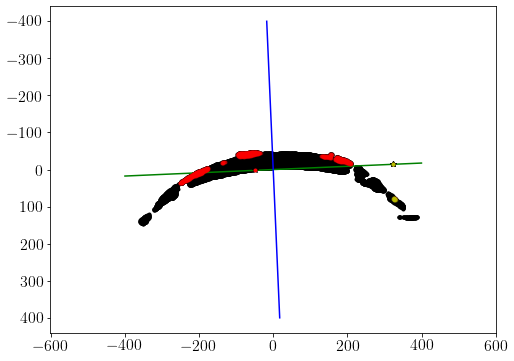


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4062 anterior_to penalty: 1.0


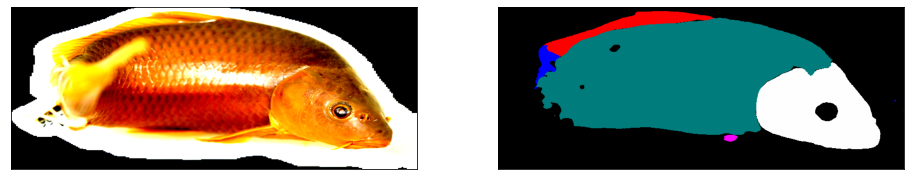

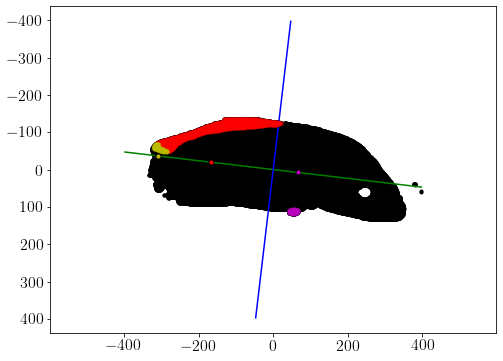


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4169 anterior_to penalty: 1.0


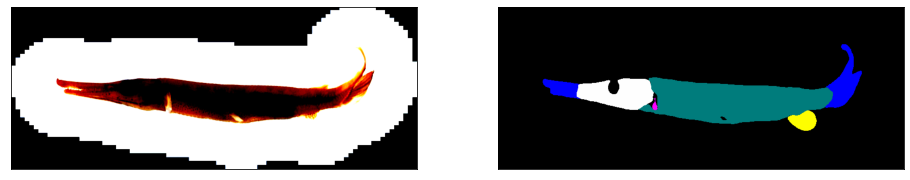

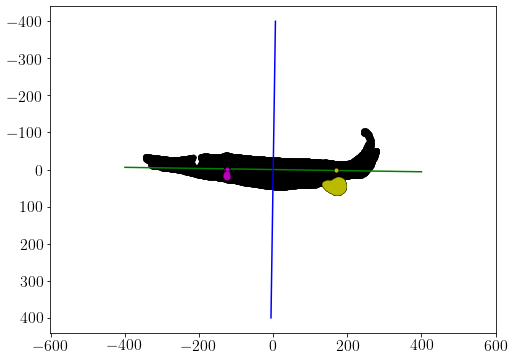


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4194 dorsal_to penalty: 2.0


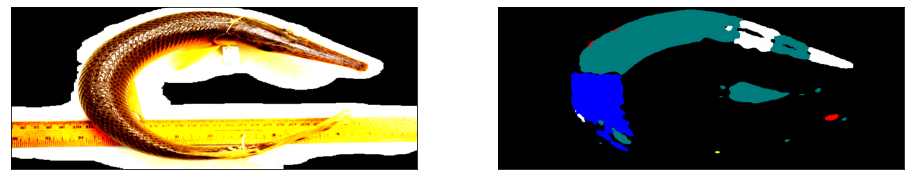

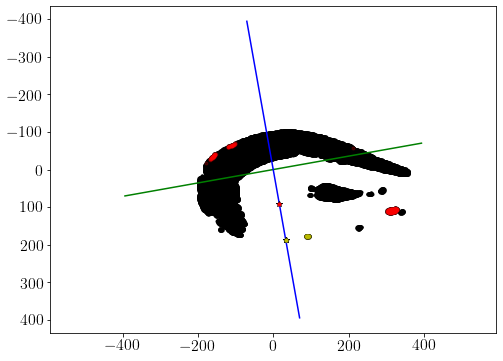


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4299 anterior_to penalty: 2.0


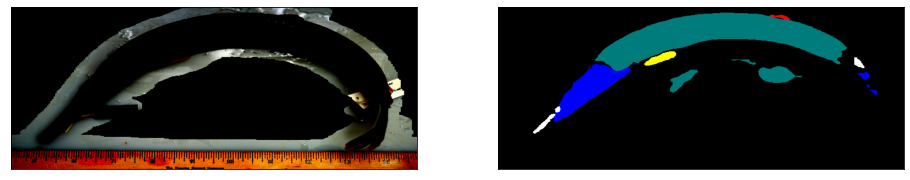

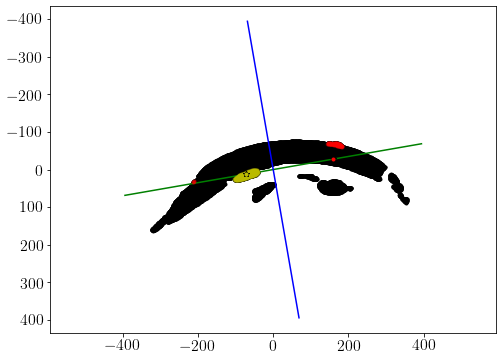


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4305 dorsal_to penalty: 2.0


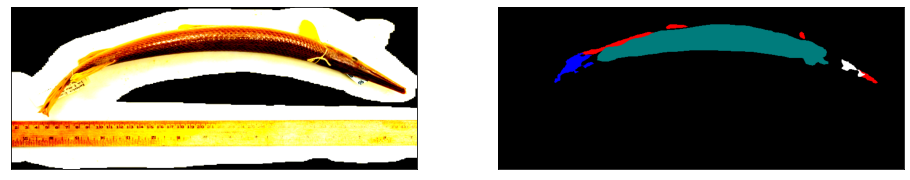

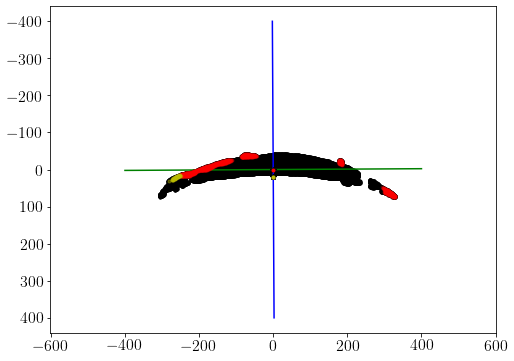


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4358 anterior_to penalty: 1.0


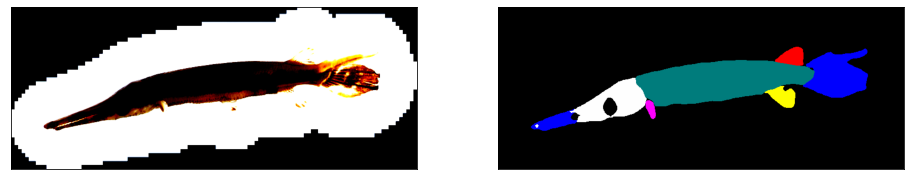

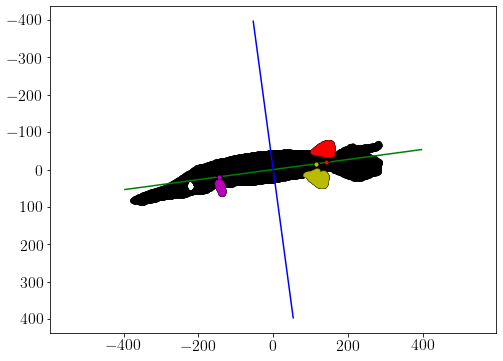


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4471 anterior_to penalty: 1.0


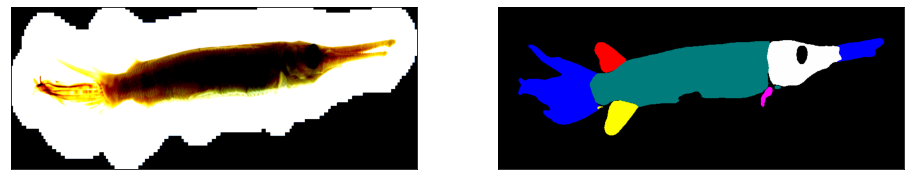

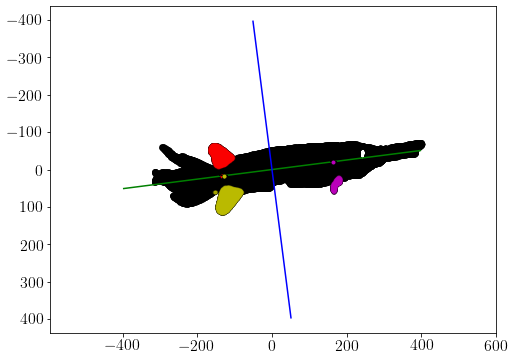


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4549 anterior_to penalty: 3.0


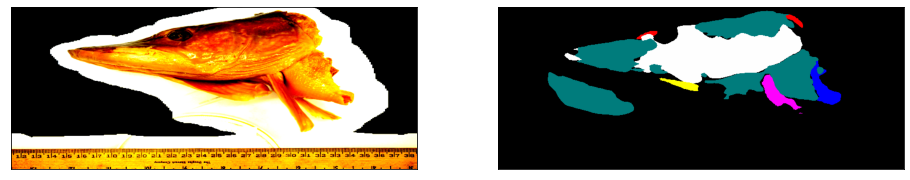

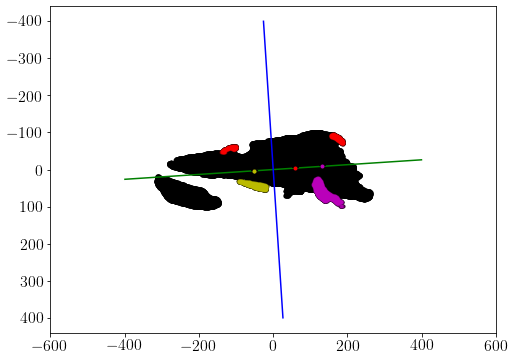


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4616 anterior_to penalty: 1.0


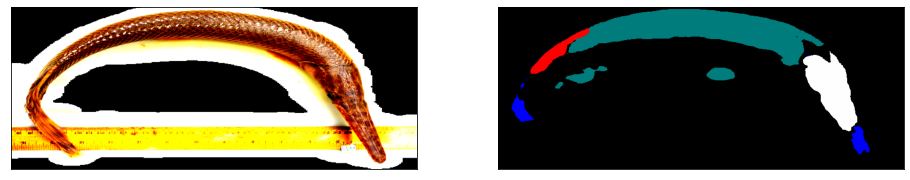

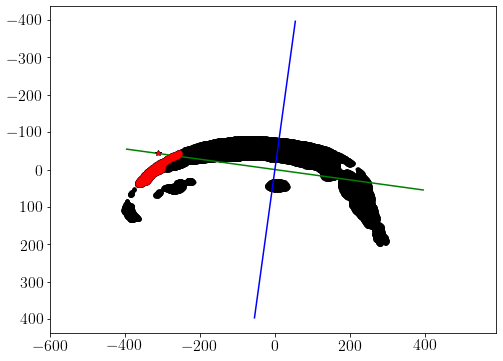


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4954 dorsal_to penalty: 2.0


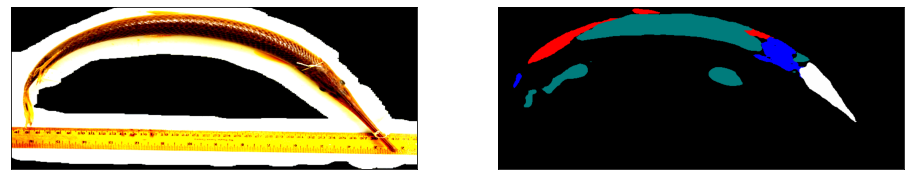

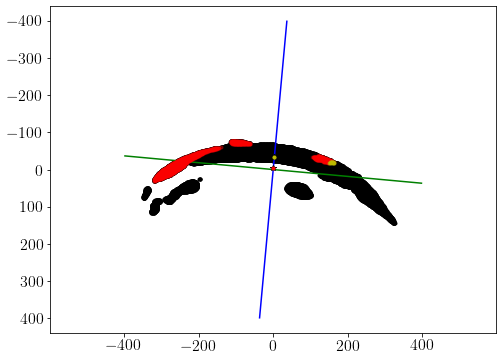

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



####################################################################################################

4954 anterior_to penalty: 1.0


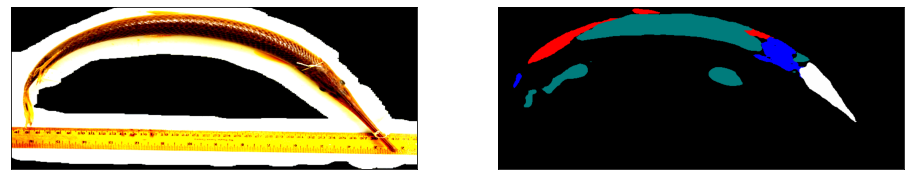

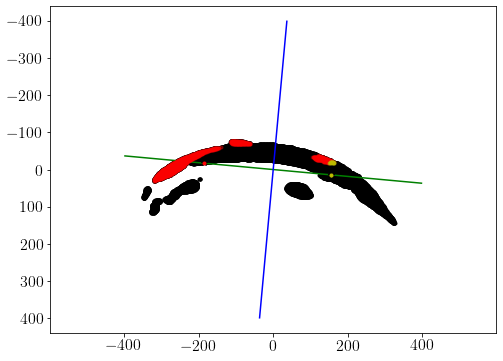


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4990 dorsal_to penalty: 2.0


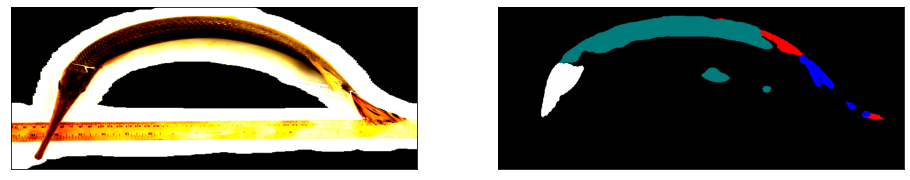

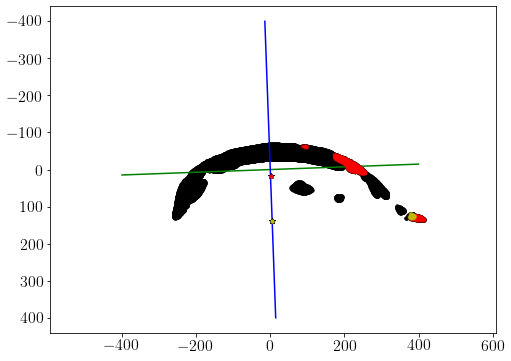

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



####################################################################################################

4990 anterior_to penalty: 1.0


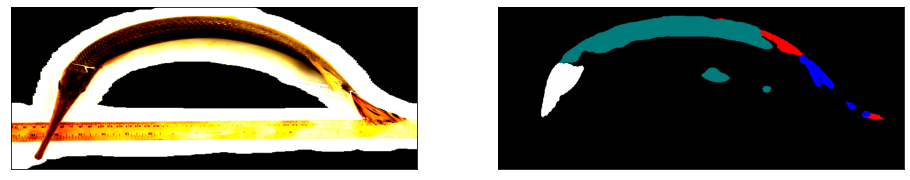

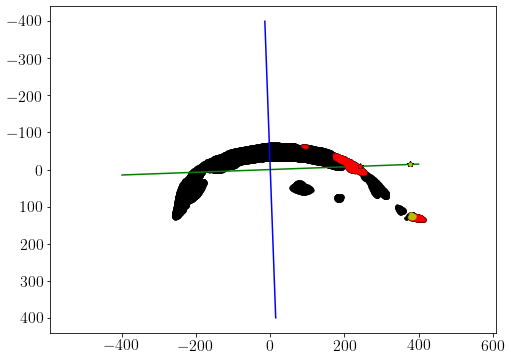


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5076 anterior_to penalty: 1.0


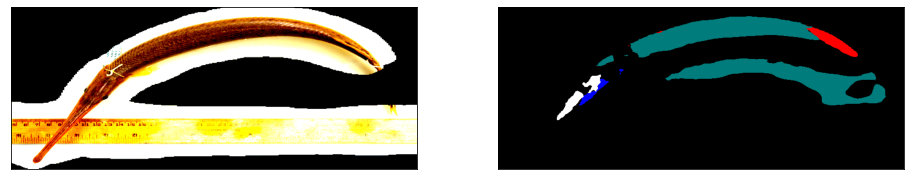

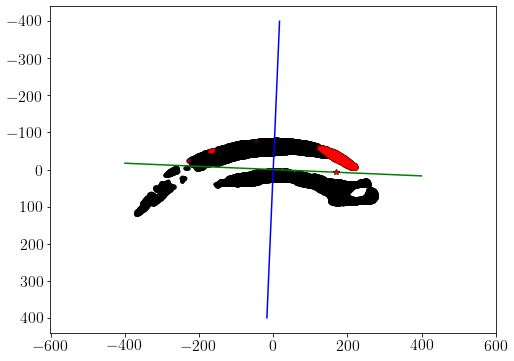


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5081 anterior_to penalty: 1.0


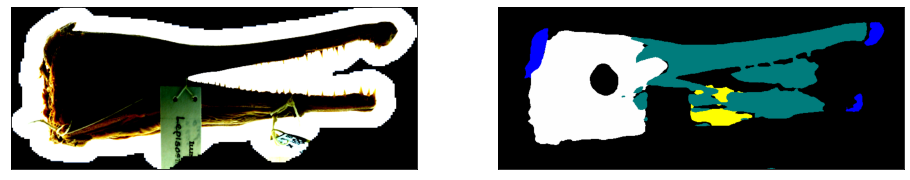

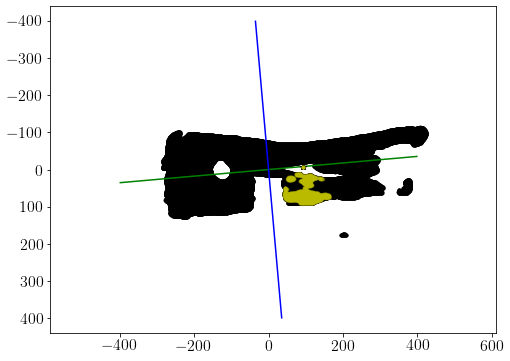


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5101 dorsal_to penalty: 2.0


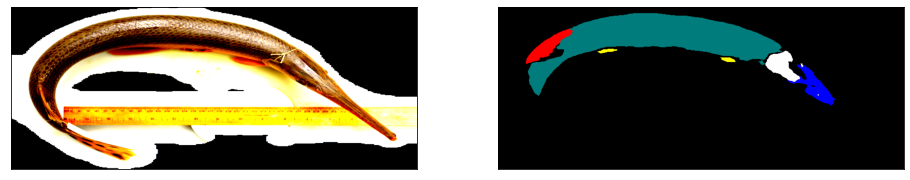

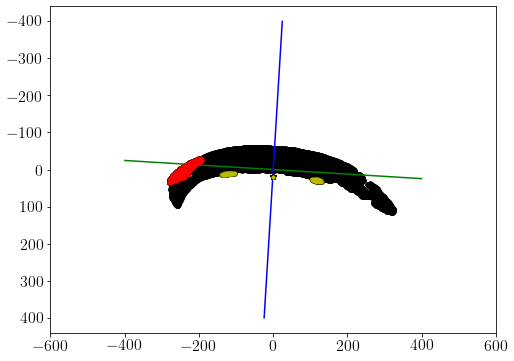

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



####################################################################################################

5101 anterior_to penalty: 2.0


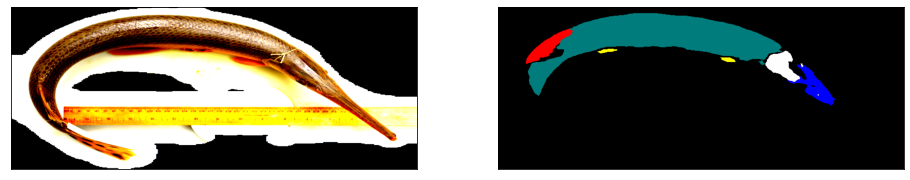

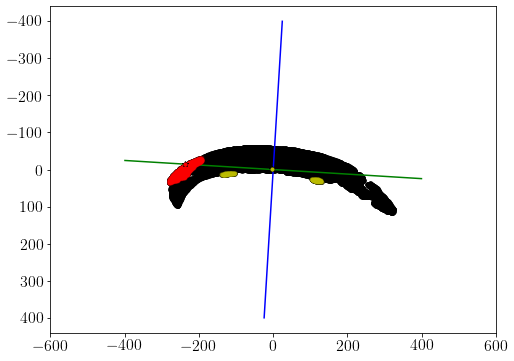


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5243 anterior_to penalty: 1.0


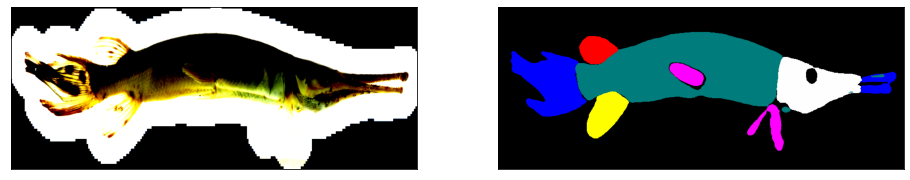

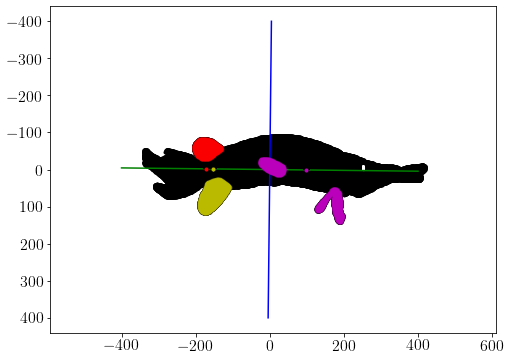


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5264 anterior_to penalty: 1.0


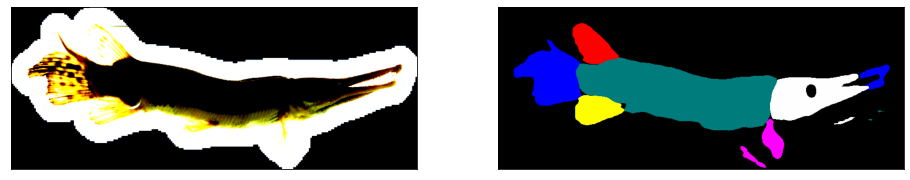

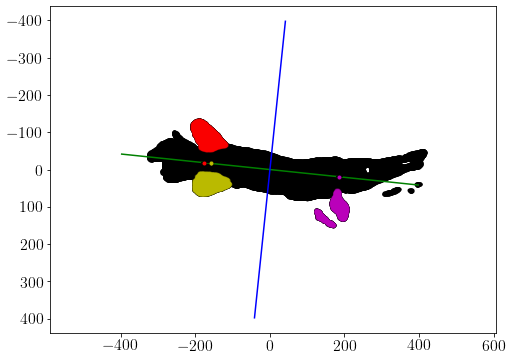


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5387 anterior_to penalty: 1.0


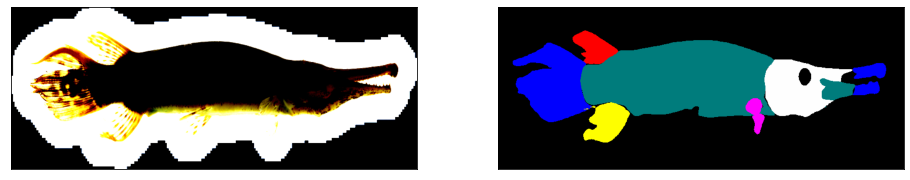

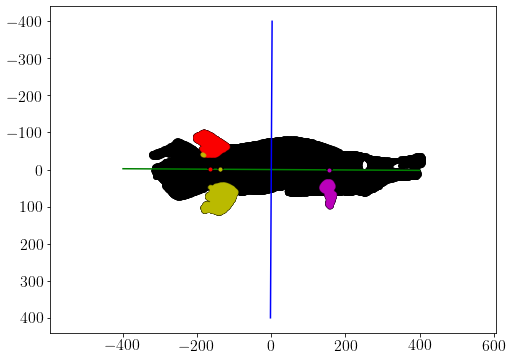


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5665 anterior_to penalty: 1.0


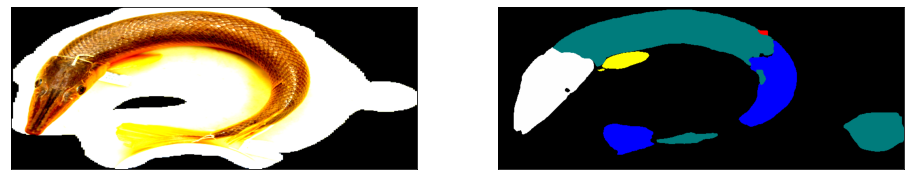

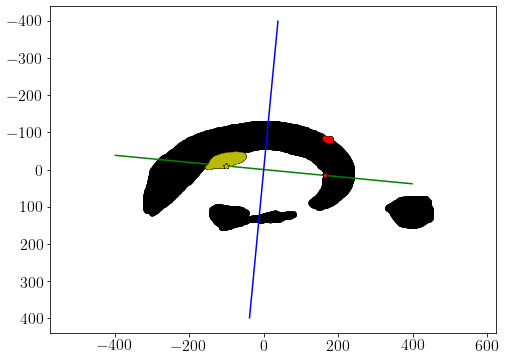


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5765 anterior_to penalty: 1.0


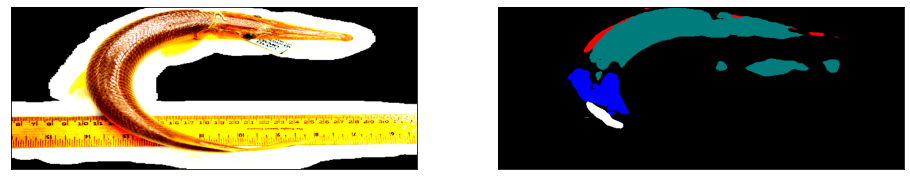

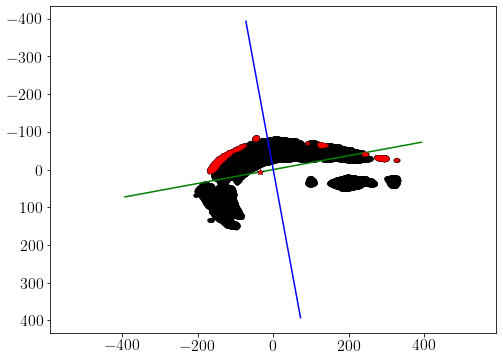


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5800 anterior_to penalty: 1.0


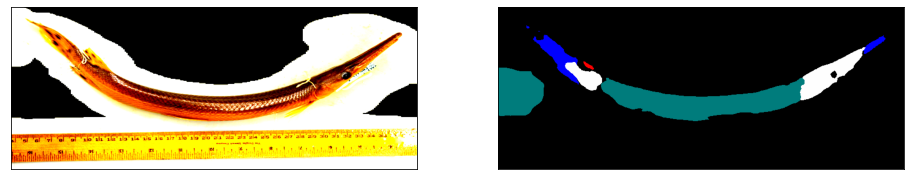

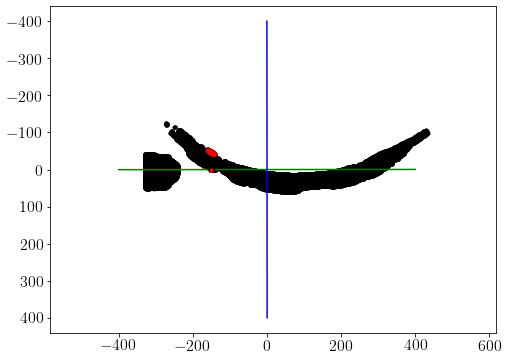


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5923 anterior_to penalty: 2.0


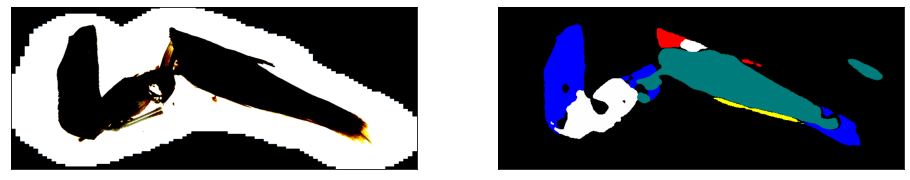

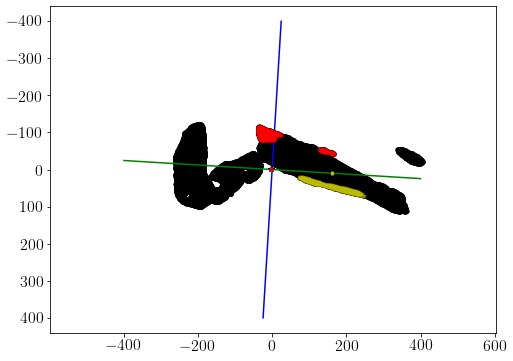


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5995 dorsal_to penalty: 2.0


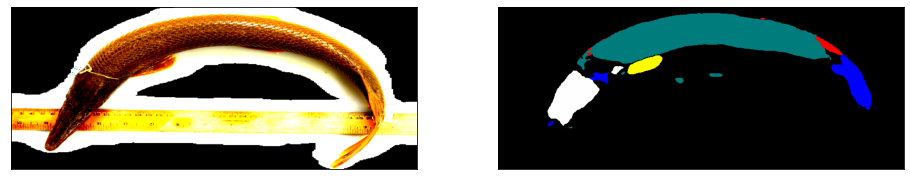

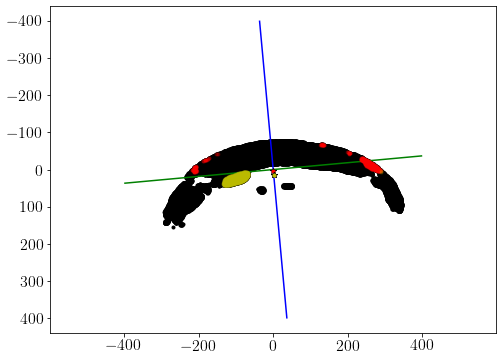


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6009 dorsal_to penalty: 2.0


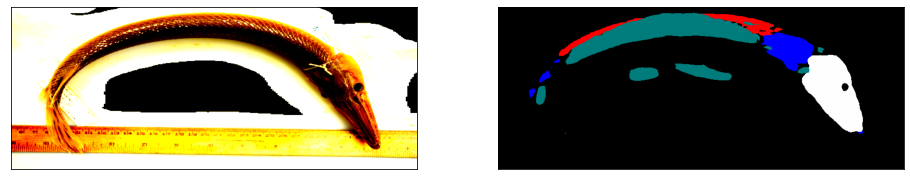

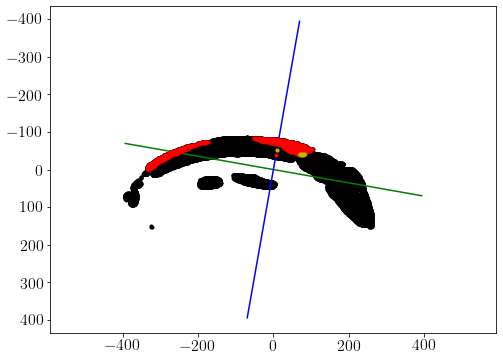

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



####################################################################################################

6009 anterior_to penalty: 2.0


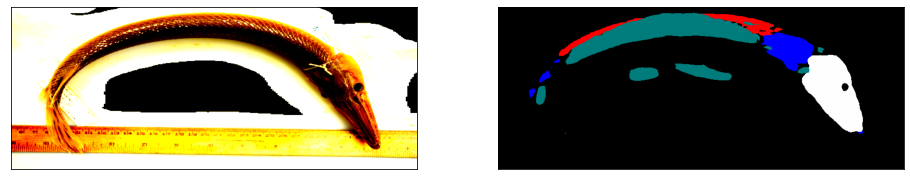

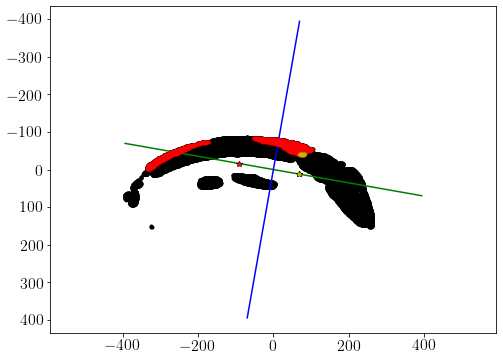


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6083 anterior_to penalty: 1.0


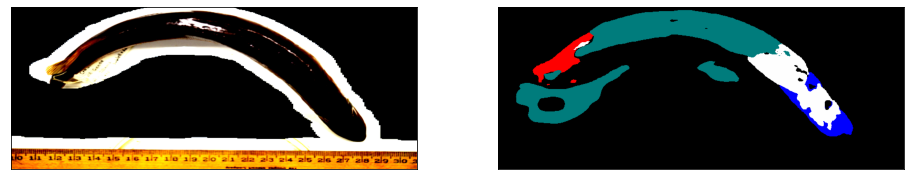

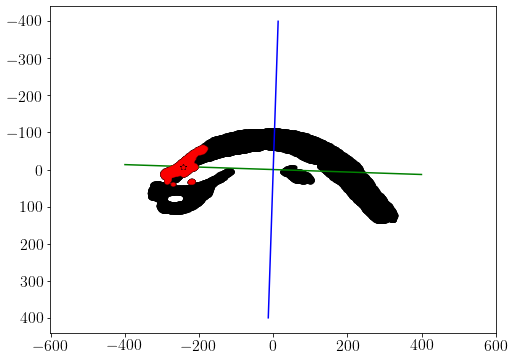


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6120 anterior_to penalty: 2.0


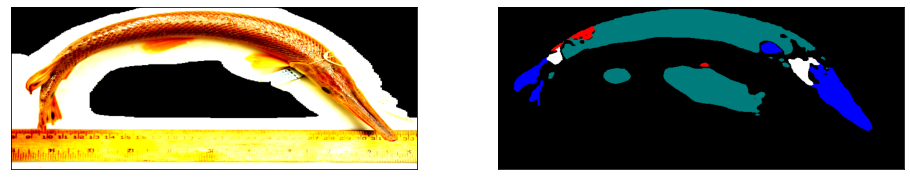

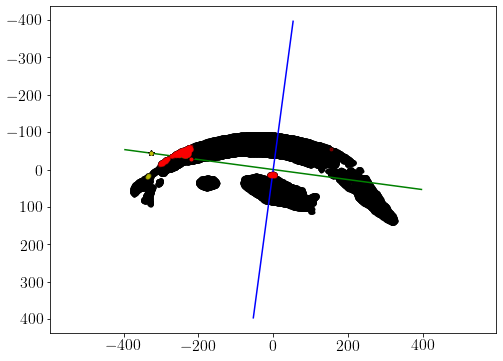


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6128 anterior_to penalty: 2.0


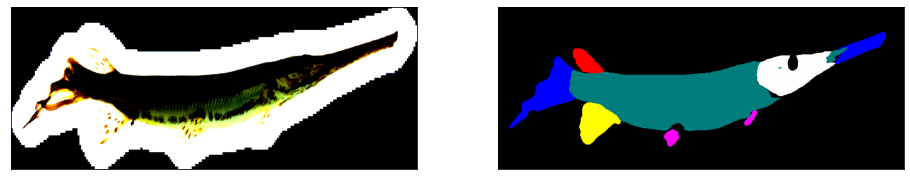

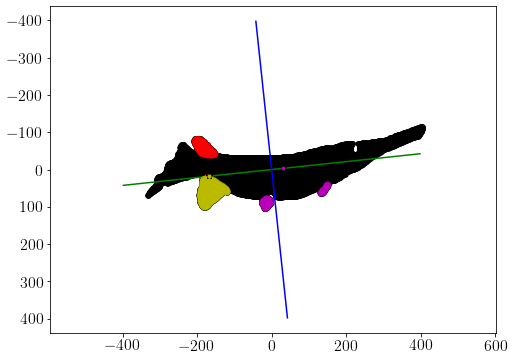


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6167 anterior_to penalty: 1.0


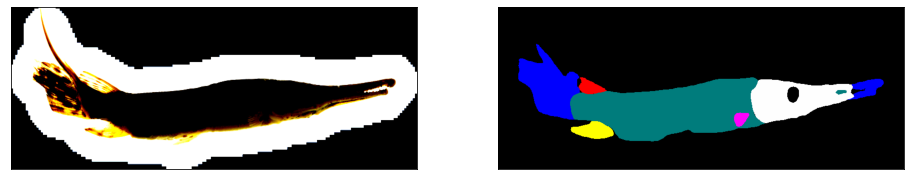

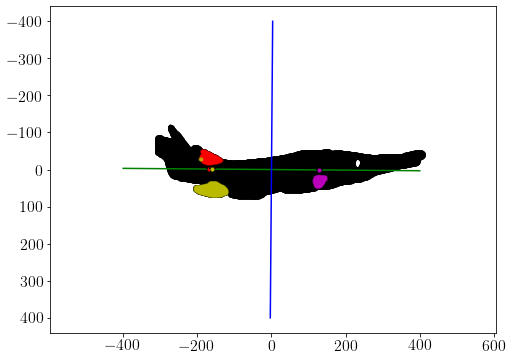


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6187 anterior_to penalty: 2.0


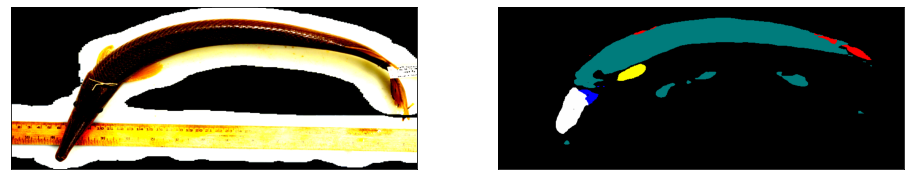

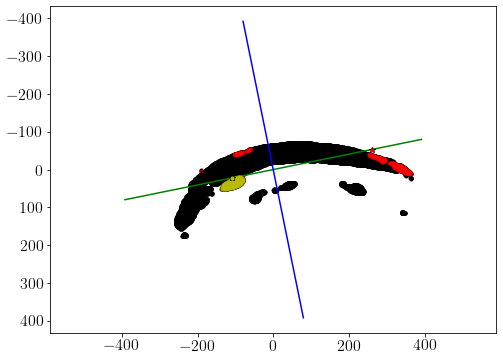


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6213 anterior_to penalty: 1.0


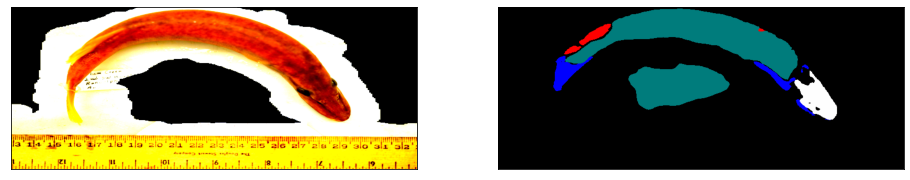

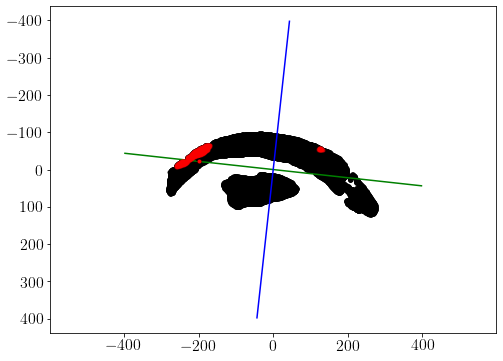


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6353 dorsal_to penalty: 2.0


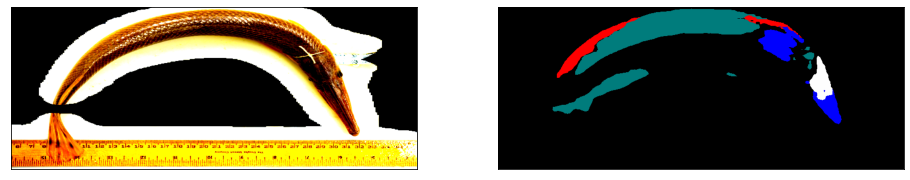

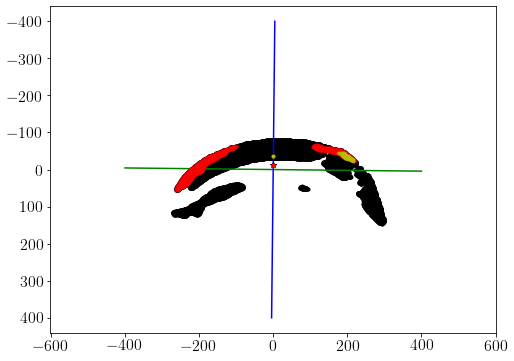

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).



####################################################################################################

6353 anterior_to penalty: 2.0


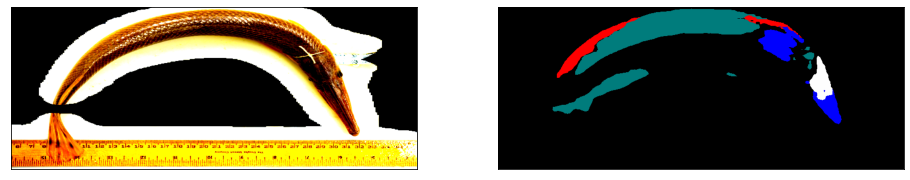

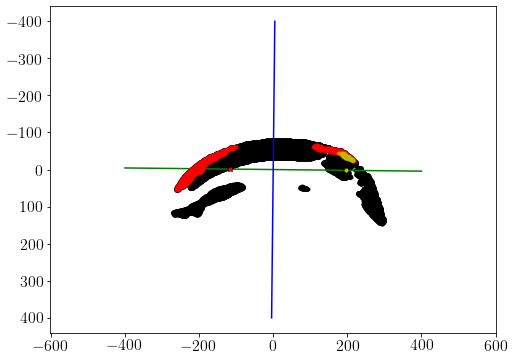


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6377 anterior_to penalty: 1.0


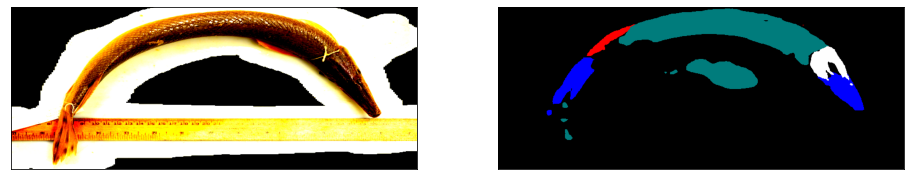

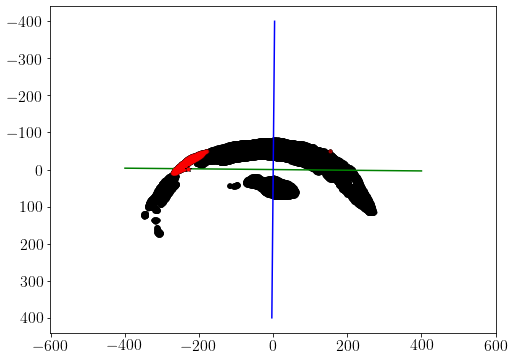


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6391 anterior_to penalty: 1.0


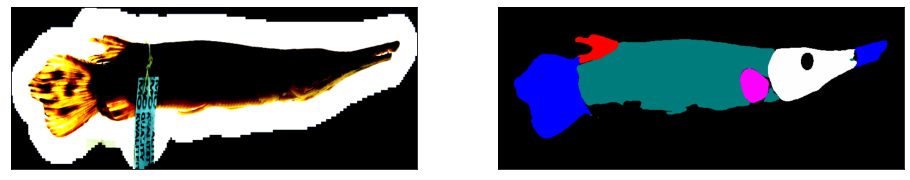

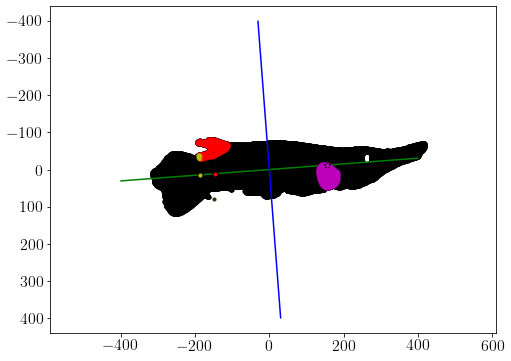


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6444 dorsal_to penalty: 2.0


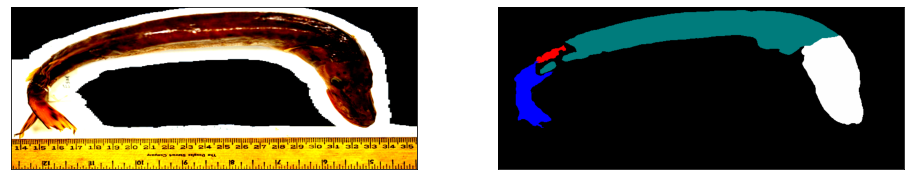

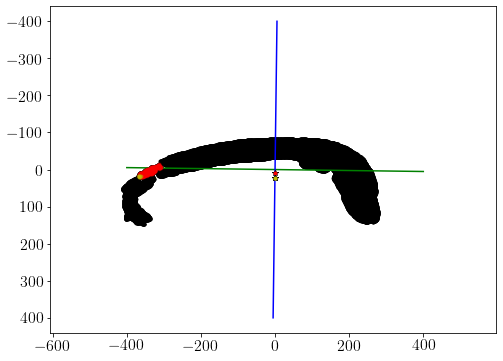


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6456 anterior_to penalty: 1.0


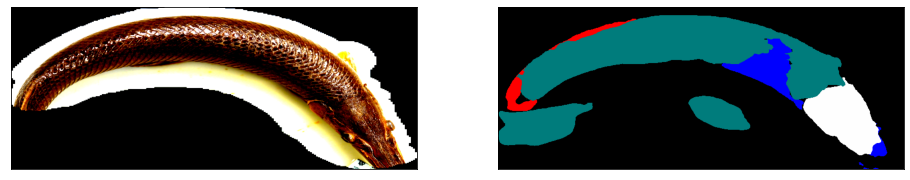

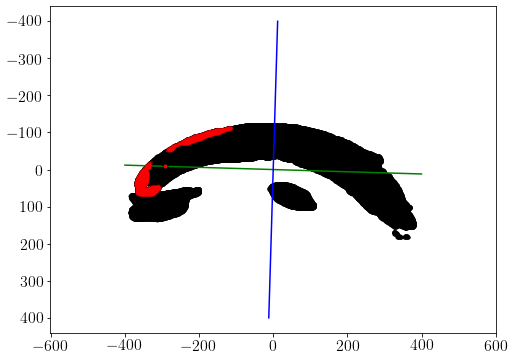


####################################################################################################

6477 anterior_to penalty: 1.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


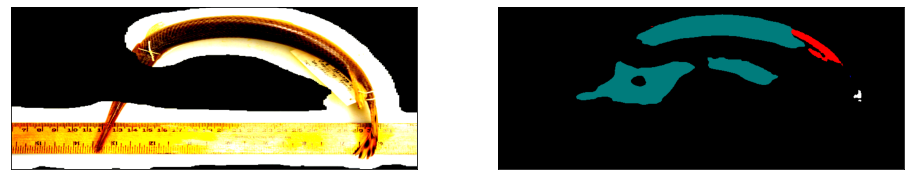

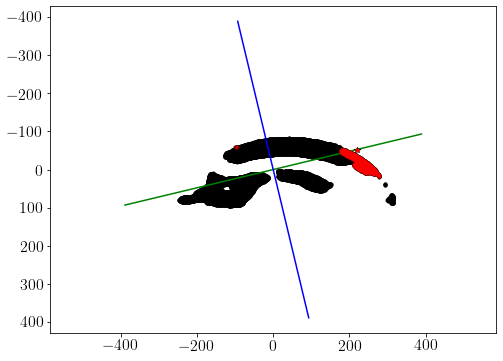


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6643 anterior_to penalty: 1.0


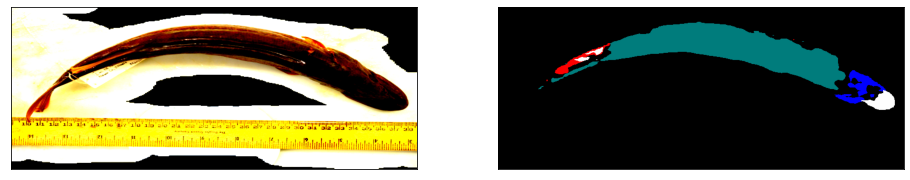

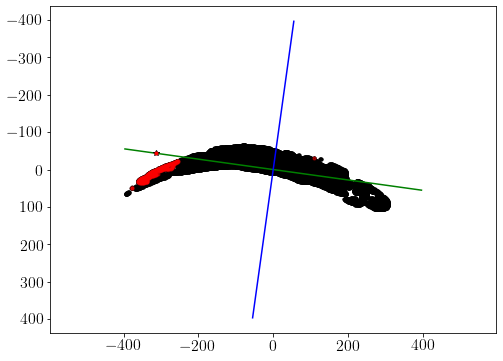


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6654 anterior_to penalty: 2.0


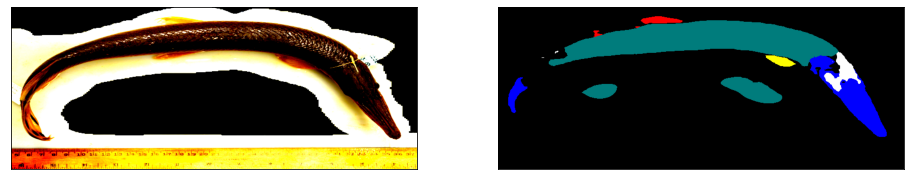

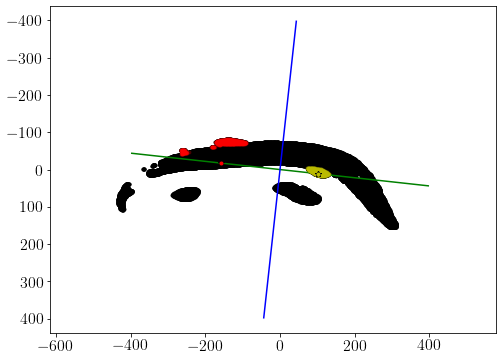


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6747 anterior_to penalty: 1.0


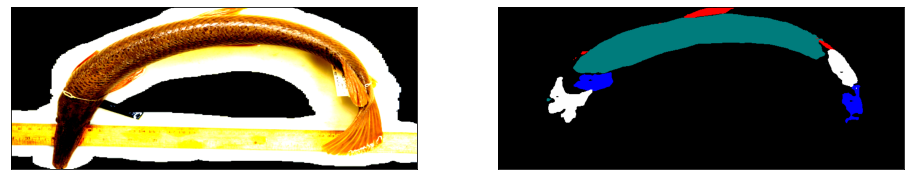

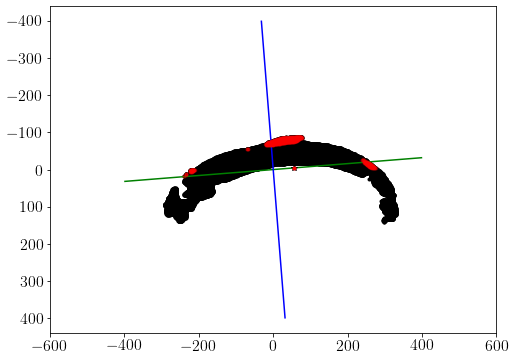


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6828 anterior_to penalty: 2.0


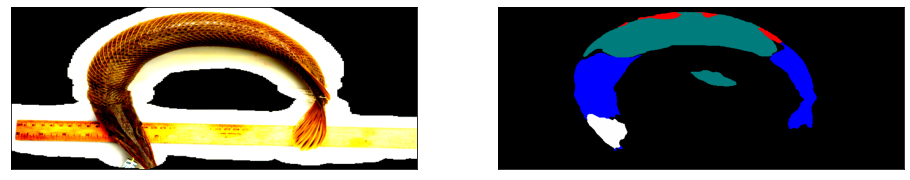

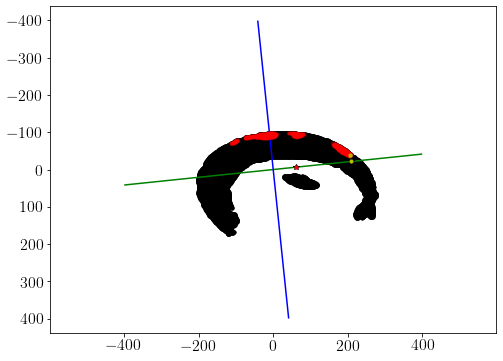


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6833 anterior_to penalty: 2.0


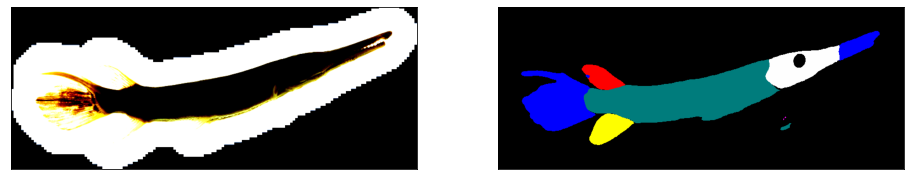

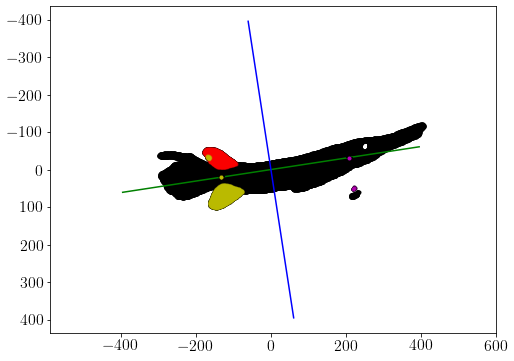


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6876 anterior_to penalty: 1.0


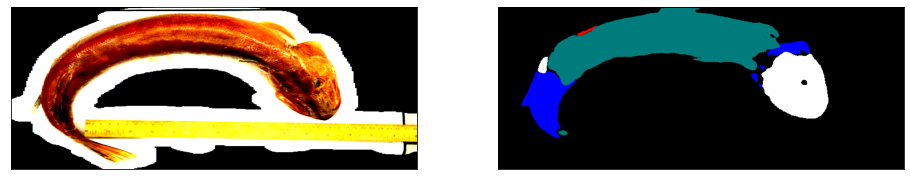

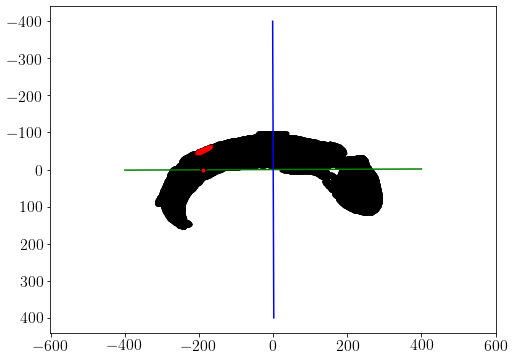


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7018 anterior_to penalty: 1.0


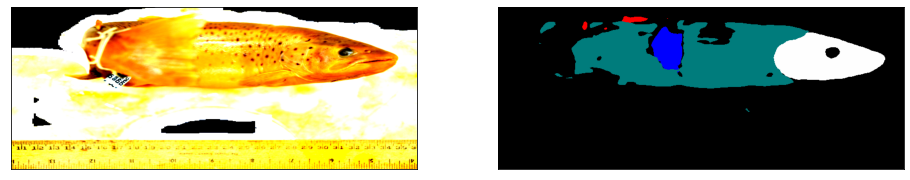

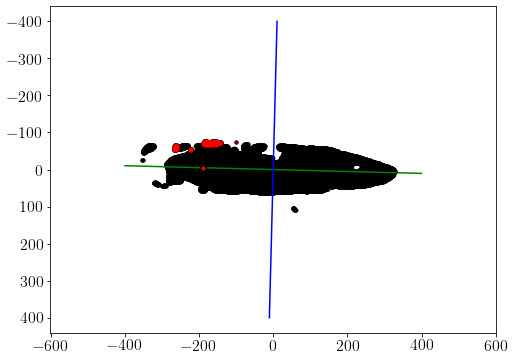


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7660 anterior_to penalty: 1.0


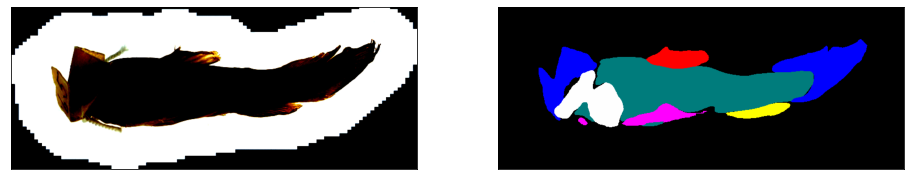

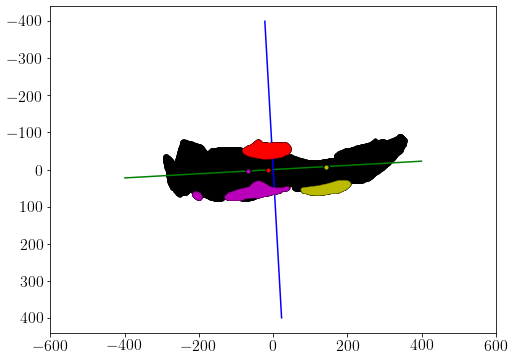


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8079 anterior_to penalty: 2.0


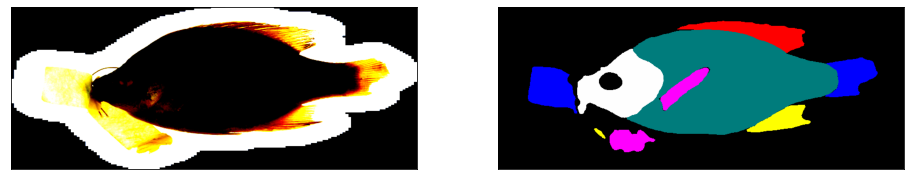

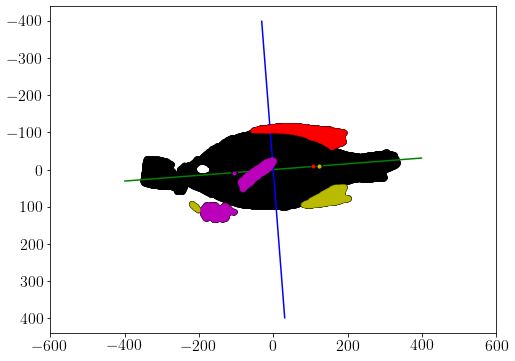


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8101 anterior_to penalty: 2.0


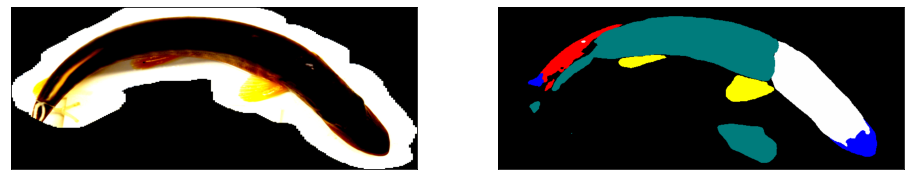

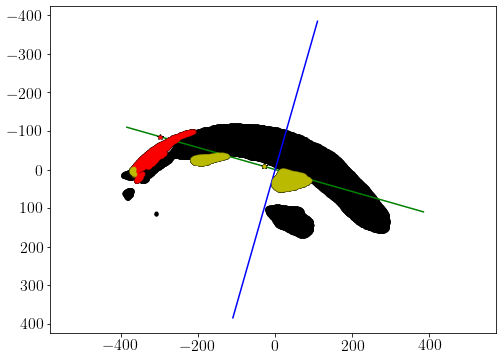


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8289 anterior_to penalty: 1.0


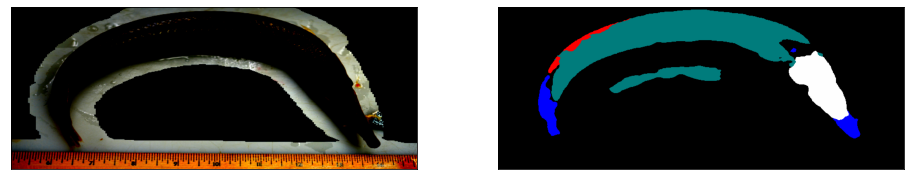

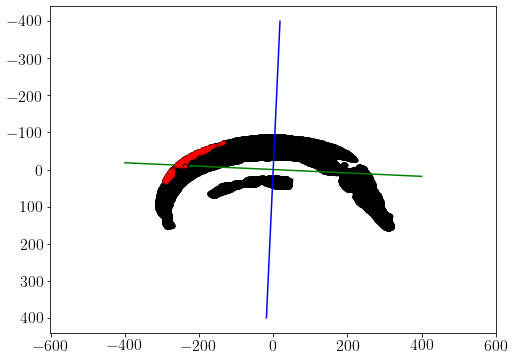


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8291 anterior_to penalty: 2.0


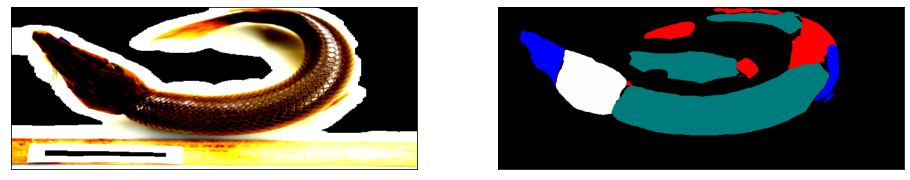

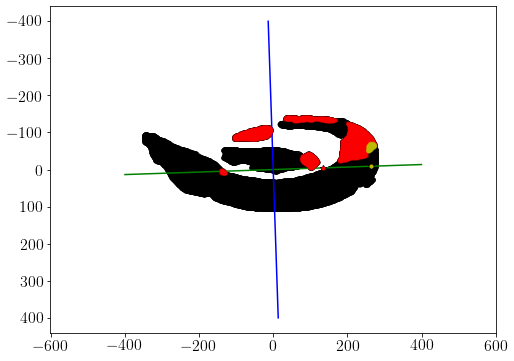


####################################################################################################

8292 anterior_to penalty: 1.0


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


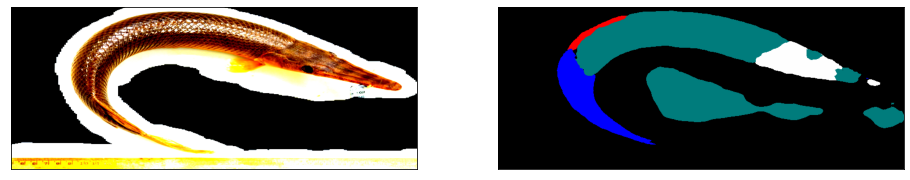

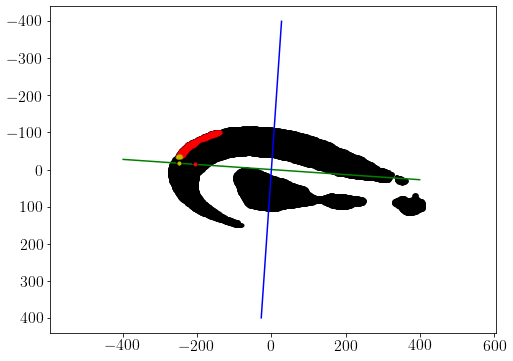


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8354 anterior_to penalty: 3.0


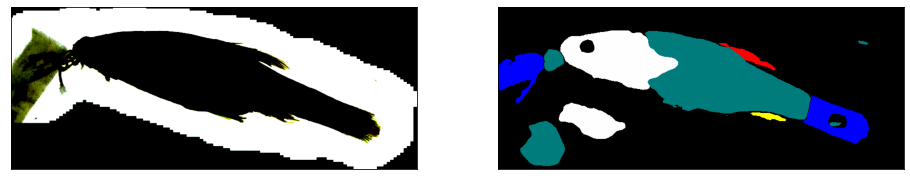

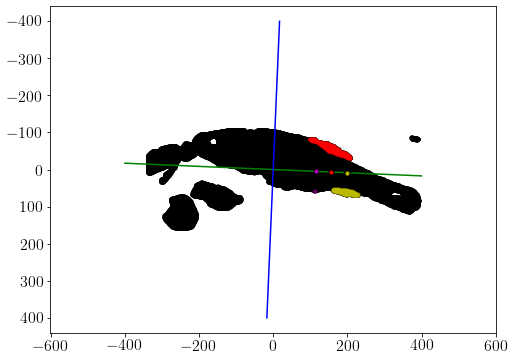


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8401 anterior_to penalty: 1.0


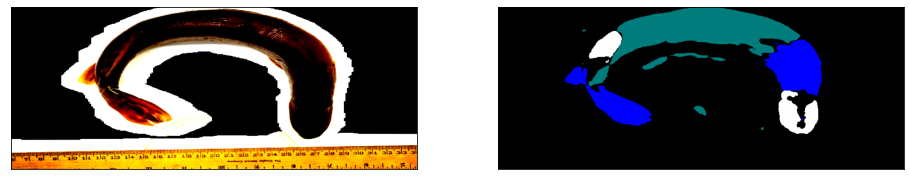

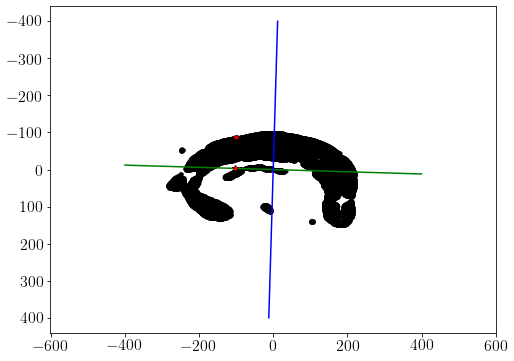


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8478 anterior_to penalty: 1.0


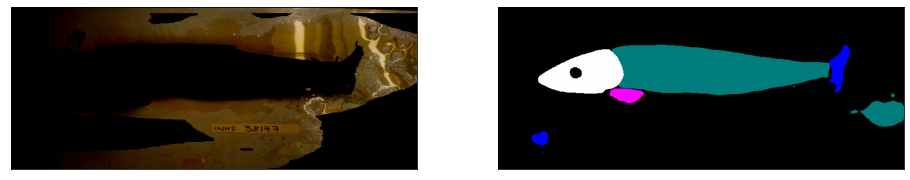

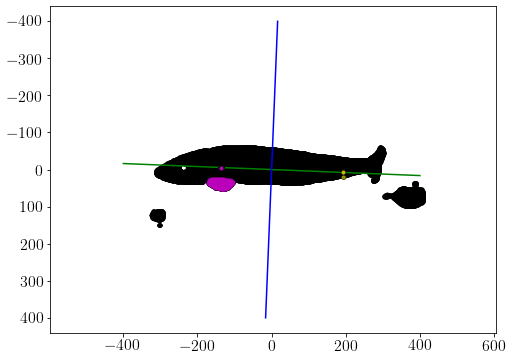


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8531 anterior_to penalty: 2.0


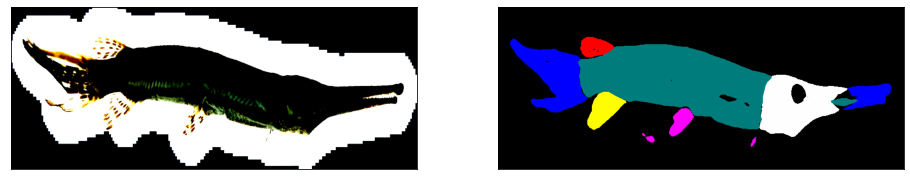

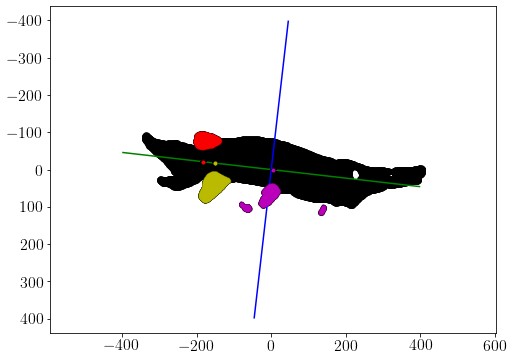


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8615 anterior_to penalty: 1.0


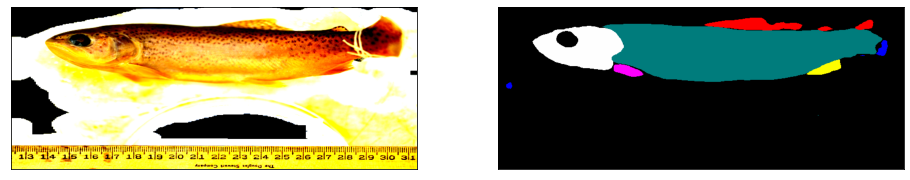

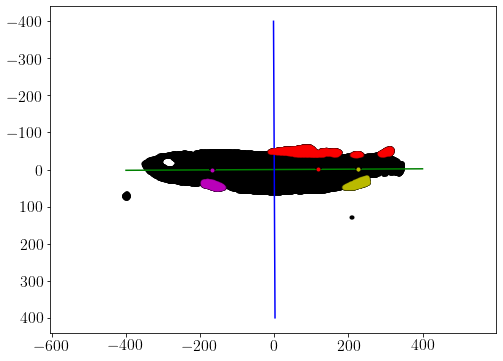


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


8980 anterior_to penalty: 2.0


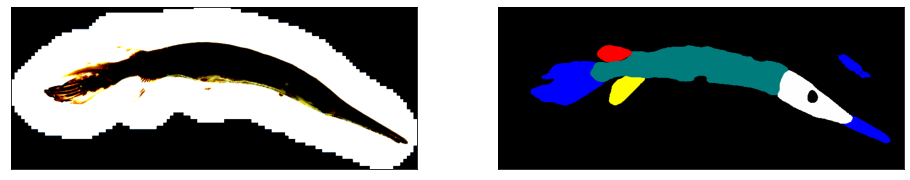

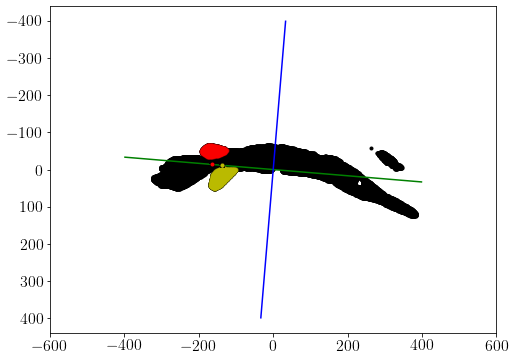


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9120 dorsal_to penalty: 2.0


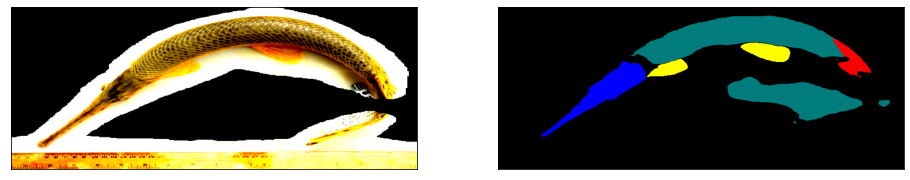

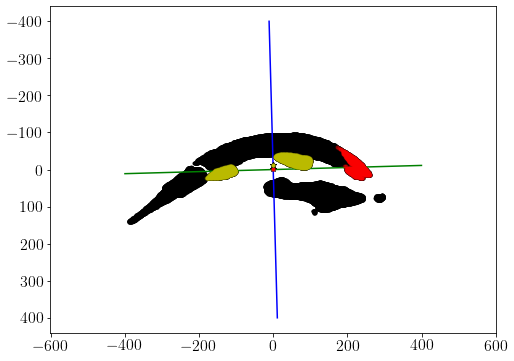


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9213 anterior_to penalty: 1.0


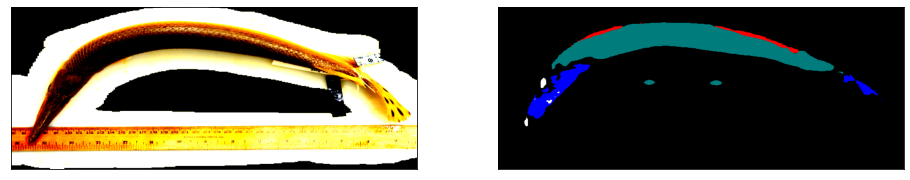

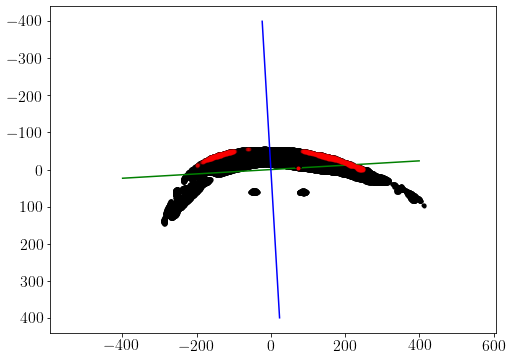


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9220 anterior_to penalty: 1.0


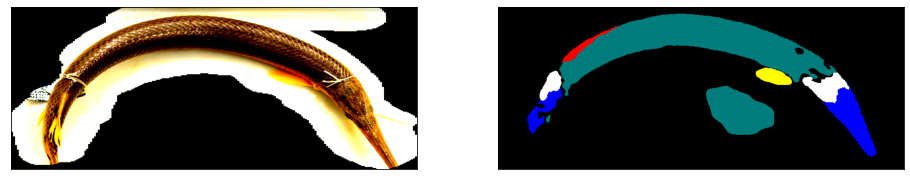

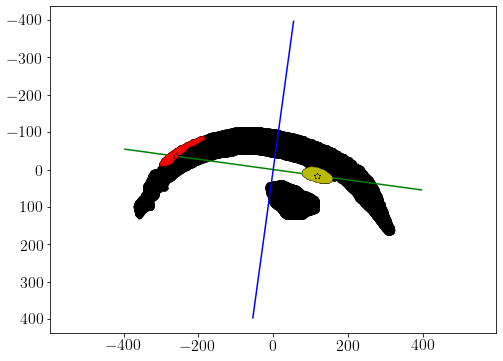


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9222 anterior_to penalty: 1.0


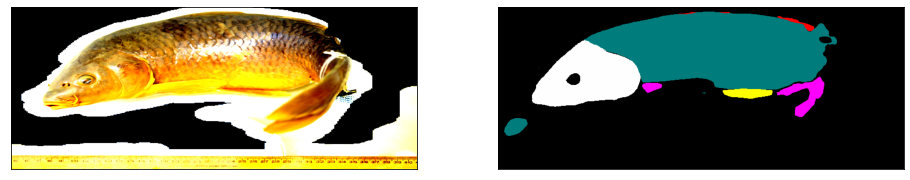

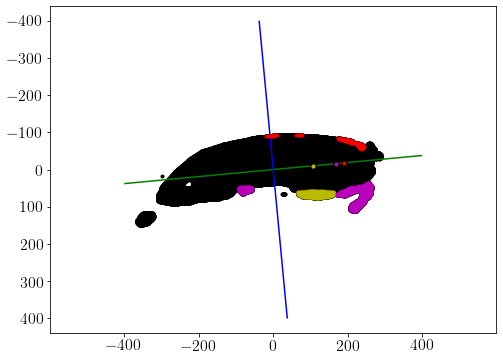


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9273 anterior_to penalty: 1.0


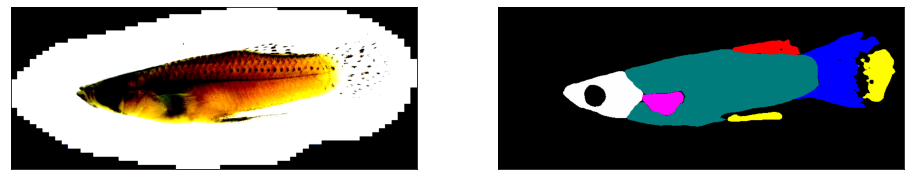

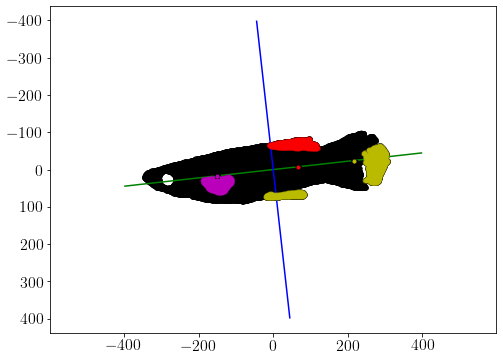


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9383 anterior_to penalty: 2.0


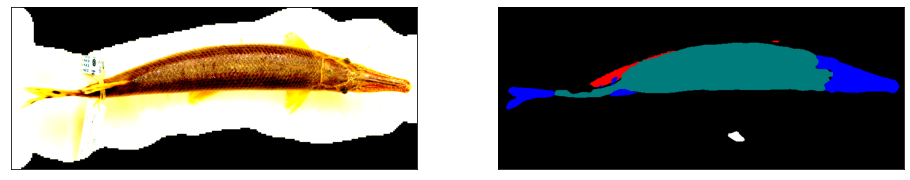

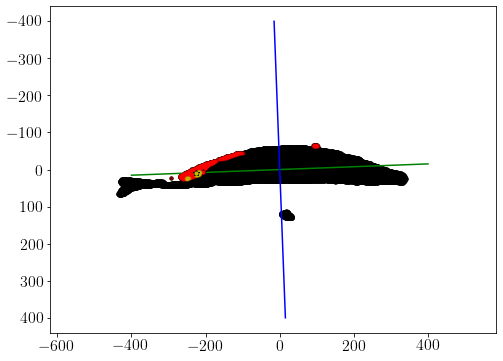


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9433 dorsal_to penalty: 2.0


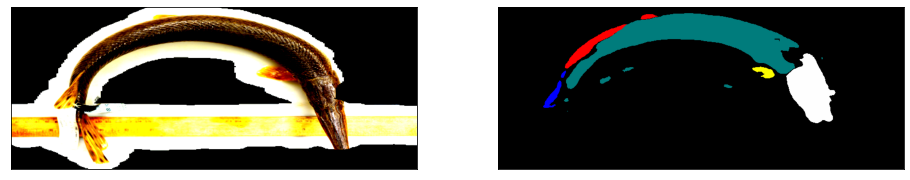

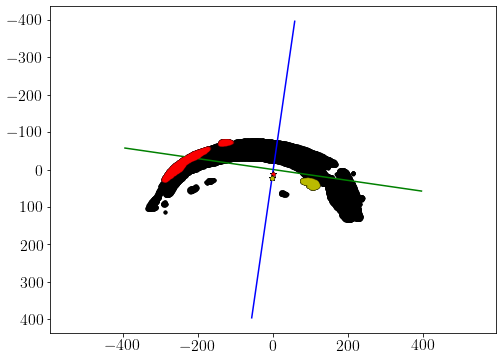


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9461 anterior_to penalty: 1.0


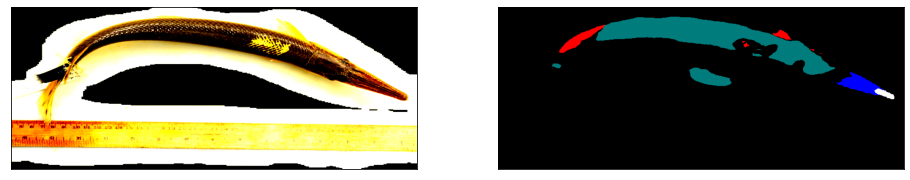

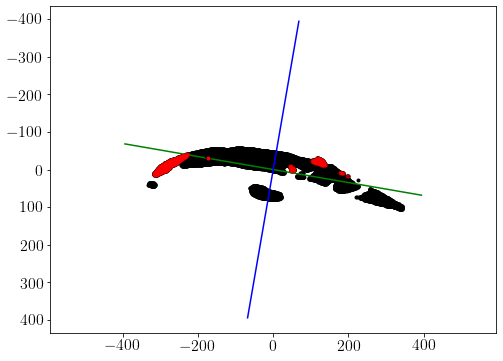


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9525 anterior_to penalty: 3.0


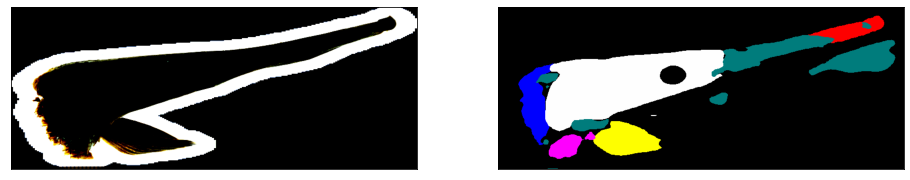

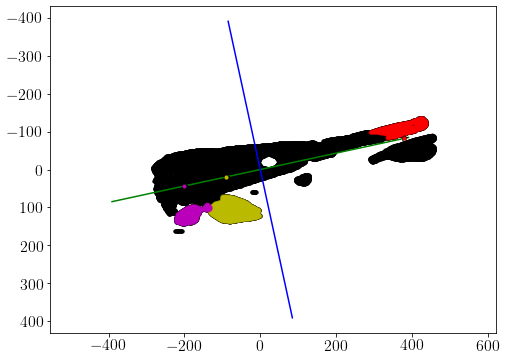


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9671 anterior_to penalty: 1.0


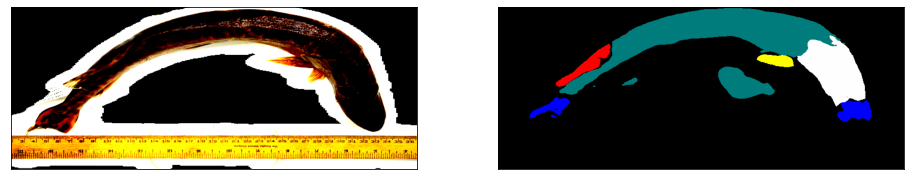

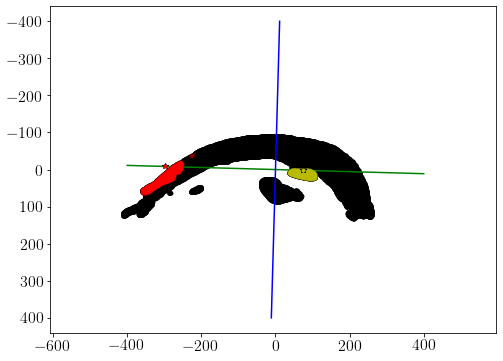


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9717 anterior_to penalty: 1.0


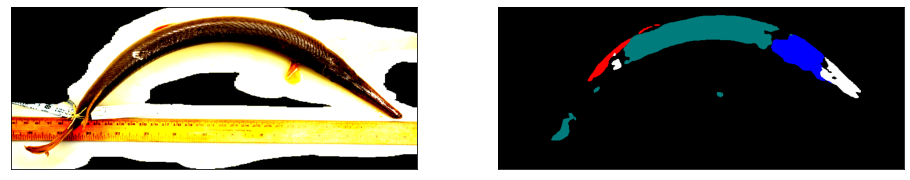

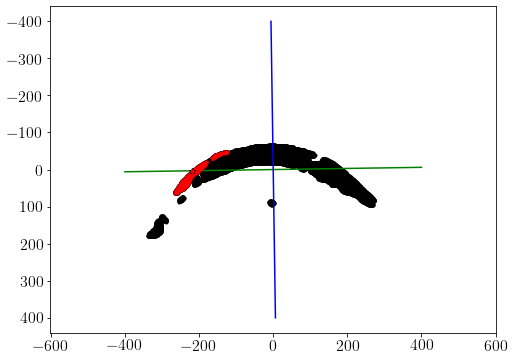


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9940 anterior_to penalty: 2.0


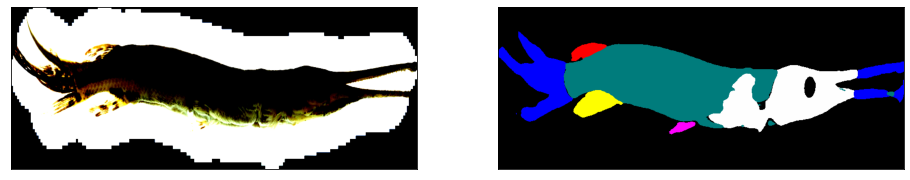

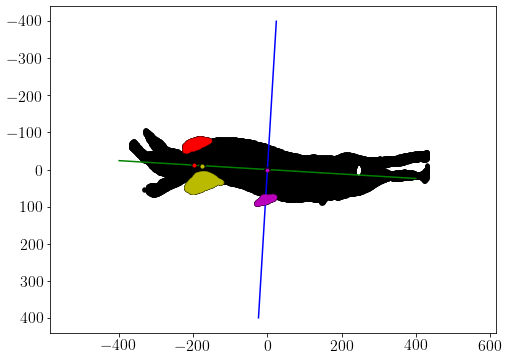


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9952 anterior_to penalty: 1.0


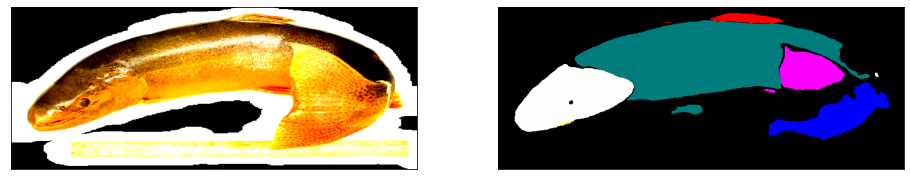

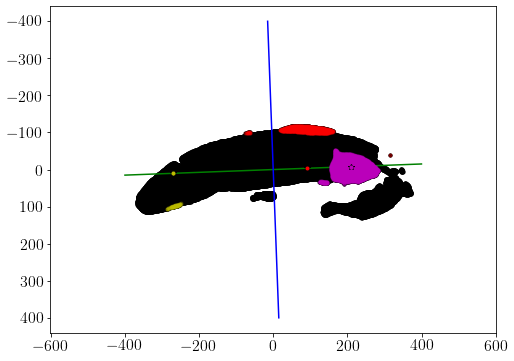


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9953 anterior_to penalty: 1.0


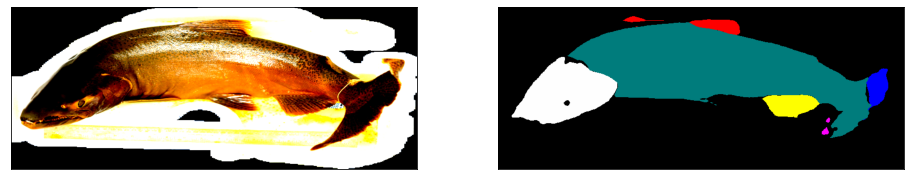

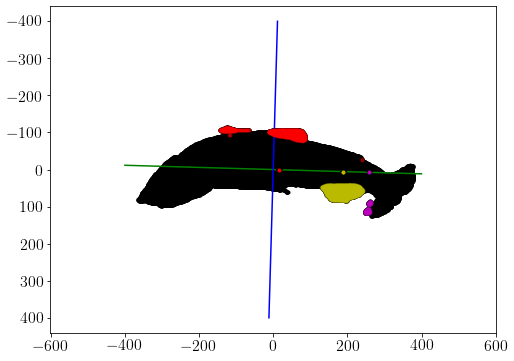


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10073 anterior_to penalty: 1.0


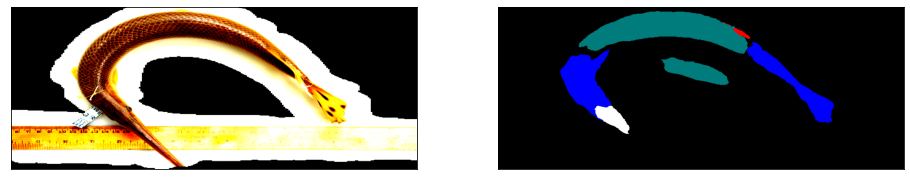

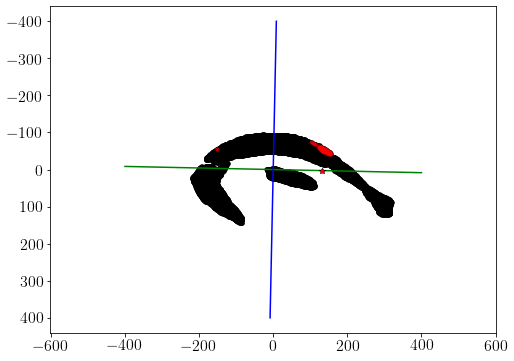


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10478 anterior_to penalty: 1.0


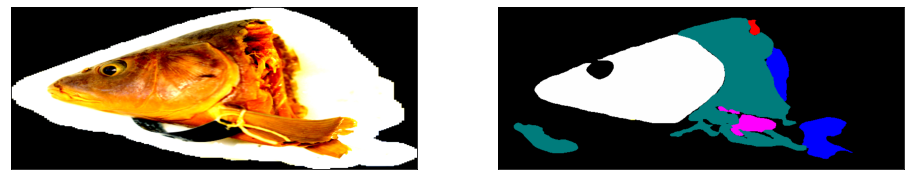

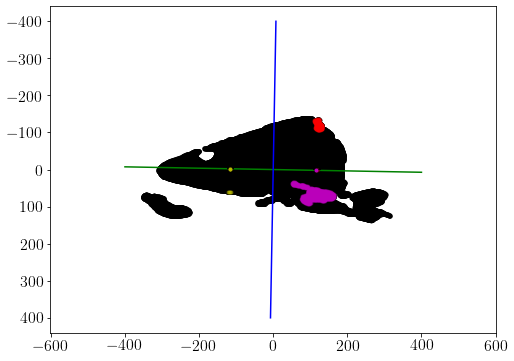


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10526 anterior_to penalty: 1.0


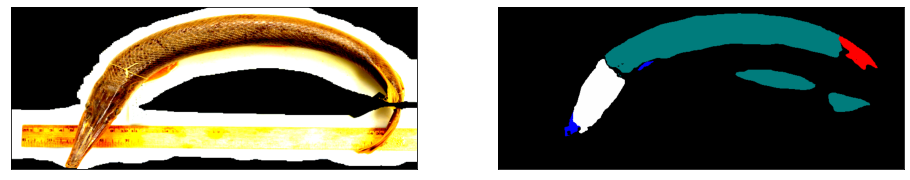

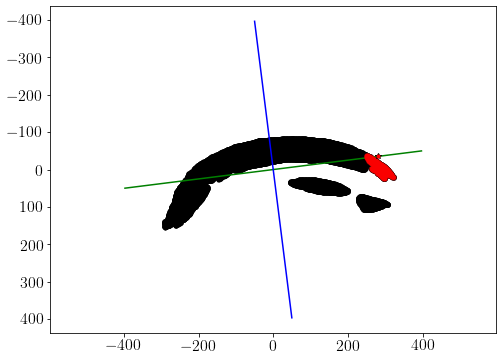


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10822 anterior_to penalty: 1.0


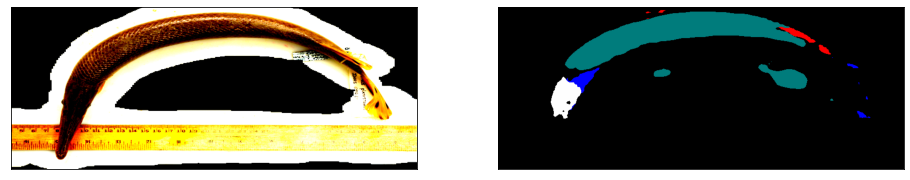

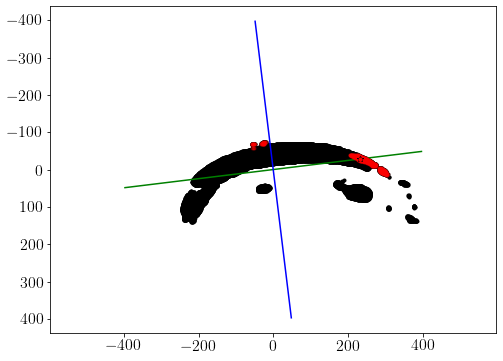


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10887 anterior_to penalty: 1.0


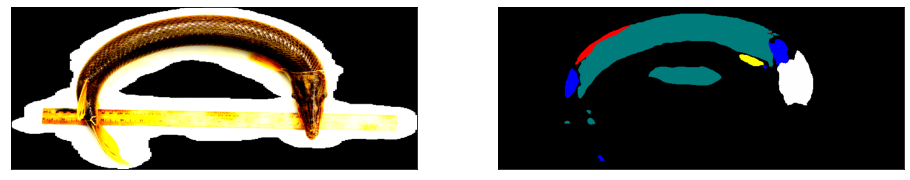

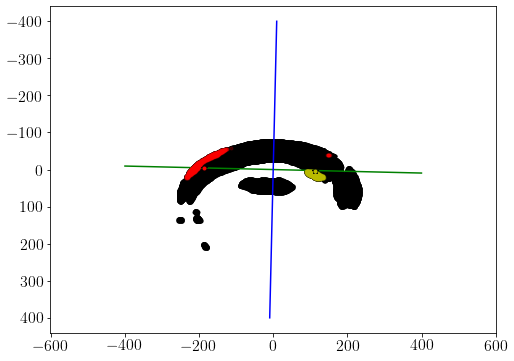


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10919 anterior_to penalty: 2.0


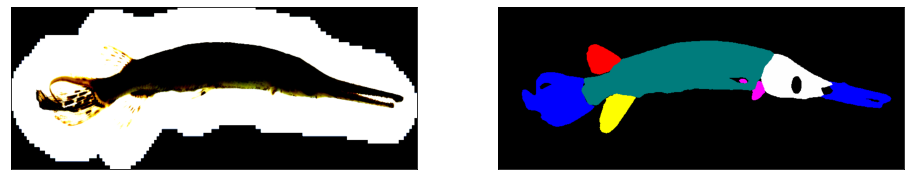

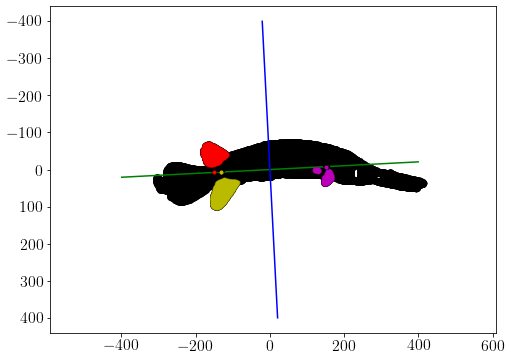


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10930 anterior_to penalty: 2.0


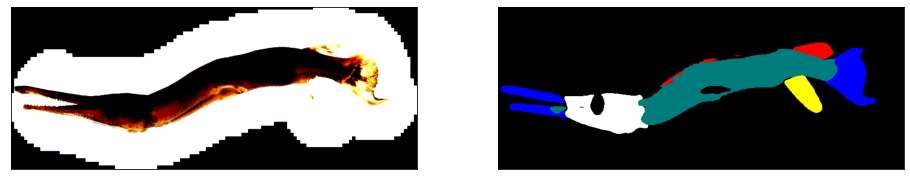

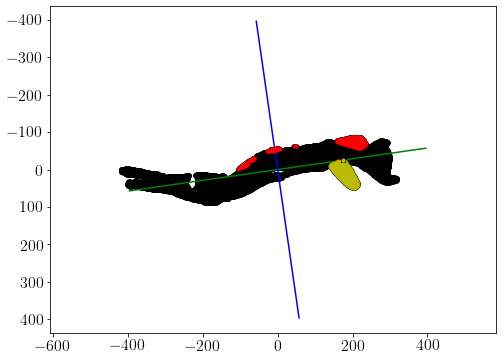


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10966 anterior_to penalty: 4.0


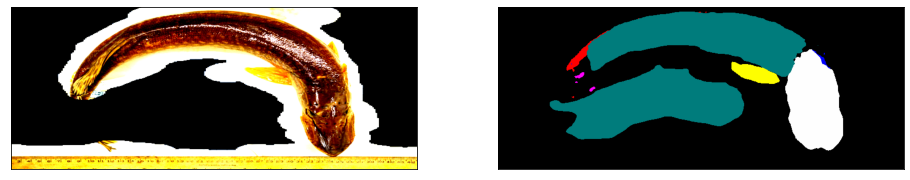

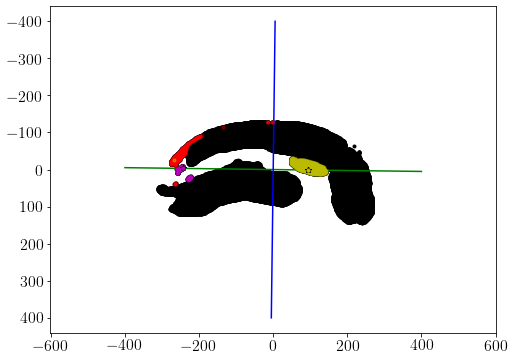


####################################################################################################



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


11043 anterior_to penalty: 2.0


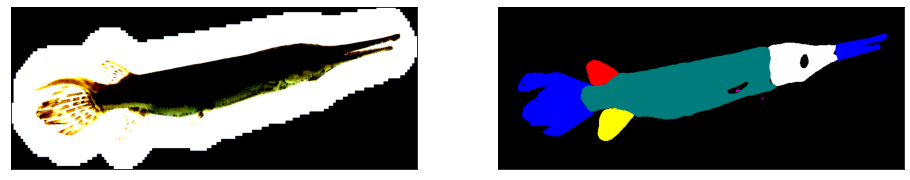

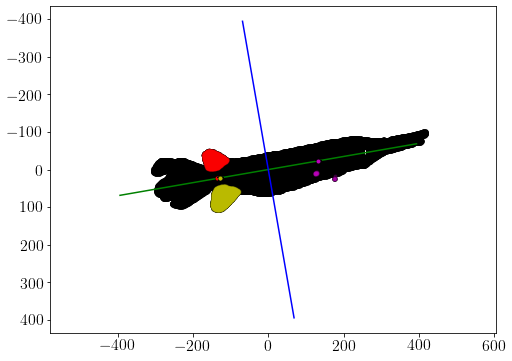


####################################################################################################



LinAlgError: Array must not contain infs or NaNs

In [45]:
# for idx in range(num_test_img):
#     i_= test_dataset_unlabeled[idx]
#     i_ = torch.from_numpy(i_).to(DEVICE).unsqueeze(0)
#     mask = best_model.forward(i_)
#     mask = mask.permute(0, 2, 3, 1)
#     mask = mask.squeeze().cpu().detach().numpy().round()
    
#     penalty_dorsal_to = dorsal_to_explicit(mask, channel_wise=True)
    
#     if penalty_dorsal_to != 0:
#         print(idx, 'dorsal_to penalty:', penalty_dorsal_to)
#         # plot the fish image that violates dorsal to 
#         plot_dorsal_to(mask, channel_wise=True)
        
#     penalty_anterior_to = anterior_to_explicit(mask, channel_wise=True)
    
#     if penalty_anterior_to != 0:
#         print(idx, 'anterior_to penalty:', penalty_anterior_to)
#         # plot the fish image that violates anterior to
#         plot_anterior_to(mask, channel_wise=True)
    
for idx in range(num_test_img):
    i_ = test_dataset_unlabeled[idx]
    img = torch.from_numpy(i_).to(DEVICE).unsqueeze(0)
    
    mask = best_model.forward(img)
    mask = mask.permute(0, 2, 3, 1)
    mask = mask.squeeze().cpu().detach().numpy().round()
    
    penalty_dorsal_to = dorsal_to_explicit(mask, channel_wise=True)
    
    if penalty_dorsal_to != 0:
        print(idx, 'dorsal_to penalty:', penalty_dorsal_to)
        
        im = img.squeeze(0).permute(1, 2, 0).cpu().detach().numpy()
        plot_double_image(im, get_color_img(mask))
        
        # plot the fish image that violates dorsal to 
        plot_dorsal_to(mask, channel_wise=True)
        
        print()
        print("#"*100)
        print()
    
        
    penalty_anterior_to = anterior_to_explicit(mask, channel_wise=True)
    
    if penalty_anterior_to != 0:
        
        print(idx, 'anterior_to penalty:', penalty_anterior_to) 
        
        im = img.squeeze(0).permute(1, 2, 0).cpu().detach().numpy()
        plot_double_image(im, get_color_img(mask))

        # plot the fish image that violates anterior to
        plot_anterior_to(mask, channel_wise=True)
        
        print()
        print("#"*100)
        print()



In [ ]:
1